# EDA

## Libraries

In [1]:
from os.path  import join
import random
import itertools
import math

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px
from pandas.plotting import parallel_coordinates
import seaborn as sns
import ipywidgets as widgets
from IPython.display import display

from sklearn.linear_model import LinearRegression, LassoCV, LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score, StratifiedKFold, RandomizedSearchCV
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import brier_score_loss
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import mutual_info_classif
from scipy.stats import pearsonr, spearmanr
import xgboost as xgb
from xgboost import XGBClassifier
import optuna
# from tabpfn import TabPFNClassifier

import warnings
np.warnings = warnings
warnings.filterwarnings('ignore')

## Data

In [2]:
data_path = '..\\..\\data'

# The Basics ------------------------------------------------------------------------
# Men
MTeams = pd.read_csv(join(data_path, 'MTeams.csv'))
MSeasons = pd.read_csv(join(data_path, 'MSeasons.csv'))
MNCAATourneySeeds = pd.read_csv(join(data_path, 'MNCAATourneySeeds.csv'))
MRegularSeasonCompactResults = pd.read_csv(join(data_path, 'MRegularSeasonCompactResults.csv'))
MNCAATourneyCompactResults = pd.read_csv(join(data_path, 'MNCAATourneyCompactResults.csv'))
# Women
WTeams = pd.read_csv(join(data_path, 'WTeams.csv'))
WSeasons = pd.read_csv(join(data_path, 'WSeasons.csv'))
WNCAATourneySeeds = pd.read_csv(join(data_path, 'WNCAATourneySeeds.csv'))
WRegularSeasonCompactResults = pd.read_csv(join(data_path, 'WRegularSeasonCompactResults.csv'))
WNCAATourneyCompactResults = pd.read_csv(join(data_path, 'WNCAATourneyCompactResults.csv'))
# Other
SampleSubmissionStage1 = pd.read_csv(join(data_path, 'SampleSubmissionStage1.csv'))
SampleSubmissionStage2 = pd.read_csv(join(data_path, 'SampleSubmissionStage2.csv'))
SeedBenchmarkStage1 = pd.read_csv(join(data_path, 'SeedBenchmarkStage1.csv'))

# Team Box Scores ------------------------------------------------------------------------
# Men
MRegularSeasonDetailedResults = pd.read_csv(join(data_path, 'MRegularSeasonDetailedResults.csv'))
MNCAATourneyDetailedResults = pd.read_csv(join(data_path, 'MNCAATourneyDetailedResults.csv'))
# Women
WRegularSeasonDetailedResults = pd.read_csv(join(data_path, 'WRegularSeasonDetailedResults.csv'))
WNCAATourneyDetailedResults = pd.read_csv(join(data_path, 'WNCAATourneyDetailedResults.csv'))

# Geography ------------------------------------------------------------------------
# All
Cities = pd.read_csv(join(data_path, 'Cities.csv'))
Conferences = pd.read_csv(join(data_path, 'Conferences.csv'))
# Men
MGameCities = pd.read_csv(join(data_path, 'MGameCities.csv'))
# Women
WGameCities = pd.read_csv(join(data_path, 'WGameCities.csv'))

# Public Rankings ------------------------------------------------------------------------
# Men
MMasseyOrdinals = pd.read_csv(join(data_path, 'MMasseyOrdinals.csv')) # men only

# Supplements ------------------------------------------------------------------------
# Men
MTeamCoaches = pd.read_csv(join(data_path, 'MTeamCoaches.csv')) # men only
MTeamConferences = pd.read_csv(join(data_path, 'MTeamConferences.csv'))
MConferenceTourneyGames = pd.read_csv(join(data_path, 'MConferenceTourneyGames.csv'))
MSecondaryTourneyTeams = pd.read_csv(join(data_path, 'MSecondaryTourneyTeams.csv'))
MSecondaryTourneyCompactResults = pd.read_csv(join(data_path, 'MSecondaryTourneyCompactResults.csv'))
MTeamSpellings = pd.read_csv(join(data_path, "MTeamSpellings.csv"), encoding='cp1252')
MNCAATourneySlots = pd.read_csv(join(data_path, 'MNCAATourneySlots.csv'))
MNCAATourneySeedRoundSlots = pd.read_csv(join(data_path, 'MNCAATourneySeedRoundSlots.csv')) # men only
# Women
WTeamConferences = pd.read_csv(join(data_path, 'WTeamConferences.csv'))
WConferenceTourneyGames = pd.read_csv(join(data_path, 'WConferenceTourneyGames.csv'))
WSecondaryTourneyTeams = pd.read_csv(join(data_path, 'WSecondaryTourneyTeams.csv'))
WSecondaryTourneyCompactResults = pd.read_csv(join(data_path, 'WSecondaryTourneyCompactResults.csv'))
WTeamSpellings = pd.read_csv(join(data_path, 'WTeamSpellings.csv'), encoding='cp1252')
WNCAATourneySlots = pd.read_csv(join(data_path, 'WNCAATourneySlots.csv'))

## Data visualisation

### How seeds are given

In [4]:
# Merge to get the winning team's seed
merged_results = pd.merge(
    MRegularSeasonCompactResults,
    MNCAATourneySeeds[['Season', 'Seed', 'TeamID']],
    left_on=['Season', 'WTeamID'],
    right_on=['Season', 'TeamID'],
    how='inner'
).rename(columns={'Seed': 'WTeamSeed'}).drop('TeamID', axis=1)

# Merge to get the losing team's seed
RegularSeasonSeedResults = pd.merge(
    merged_results,
    MNCAATourneySeeds[['Season', 'Seed', 'TeamID']],
    left_on=['Season', 'LTeamID'],
    right_on=['Season', 'TeamID'],
    how='inner'
).rename(columns={'Seed': 'LTeamSeed'}).drop('TeamID', axis=1)

# Extract numeric seed values
RegularSeasonSeedResults['WTeamSeedRaw'] = RegularSeasonSeedResults['WTeamSeed'].str.extract('(\d+)')[0].astype(int)
RegularSeasonSeedResults['LTeamSeedRaw'] = RegularSeasonSeedResults['LTeamSeed'].str.extract('(\d+)')[0].astype(int)

RegularSeasonSeedResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WTeamSeed,LTeamSeed,WTeamSeedRaw,LTeamSeedRaw
0,1985,20,1228,81,1328,64,N,0,W03,Y01,3,1
1,1985,33,1228,73,1328,70,H,0,W03,Y01,3,1
2,1985,118,1242,82,1328,76,H,0,Z03,Y01,3,1
3,1985,54,1374,85,1328,76,N,0,W05,Y01,5,1
4,1985,72,1409,104,1328,89,H,0,X06,Y01,6,1


Win counts for seeds (teams made it into the turney) vs other seeded teams in RegularSeason


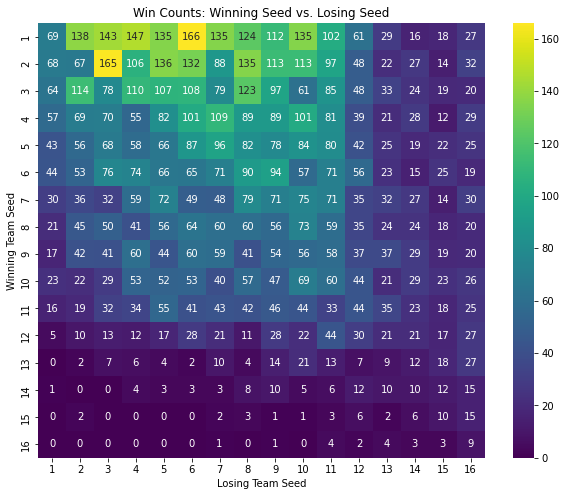

In [5]:
# Create the 16x16 matrix with seed values from 1 to 16
seed_matrix = pd.crosstab(RegularSeasonSeedResults['WTeamSeedRaw'], RegularSeasonSeedResults['LTeamSeedRaw'])
seeds = range(1, 17)
seed_matrix = seed_matrix.reindex(index=seeds, columns=seeds, fill_value=0)

print("Win counts for seeds (teams made it into the turney) vs other seeded teams in RegularSeason")
# If you are in a Jupyter Notebook, simply display the styled DataFrame:

# Plot a heatmap with annotations
plt.figure(figsize=(10, 8))
sns.heatmap(seed_matrix, annot=True, fmt='d', cmap='viridis')
plt.title('Win Counts: Winning Seed vs. Losing Seed')
plt.xlabel('Losing Team Seed')
plt.ylabel('Winning Team Seed')
plt.show()

That means teams who get low number seed and make it into the tournament tend to get matched against teams they won against in the regular season.

Scores from regular season


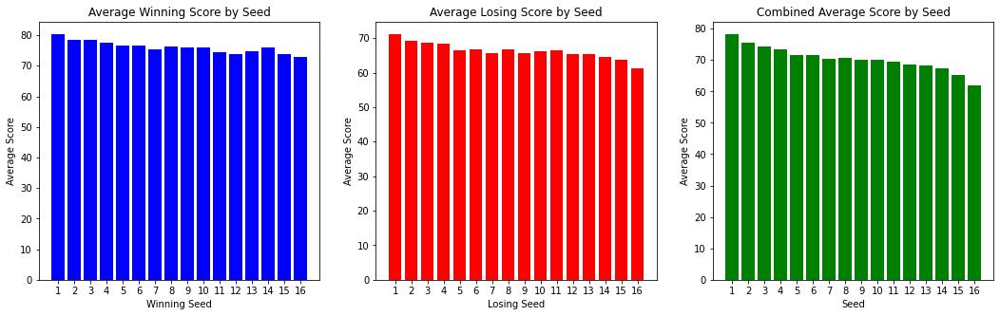

In [6]:
# Compute average score for winning teams grouped by winning seed
avg_win = RegularSeasonSeedResults.groupby('WTeamSeedRaw')['WScore'].mean().sort_index()

# Compute average score for losing teams grouped by losing seed
avg_loss = RegularSeasonSeedResults.groupby('LTeamSeedRaw')['LScore'].mean().sort_index()

# For combined average: combine winning and losing scores into one dataframe.
winning_scores = RegularSeasonSeedResults[['WTeamSeedRaw', 'WScore']].rename(columns={'WTeamSeedRaw':'Seed', 'WScore':'Score'})
losing_scores  = RegularSeasonSeedResults[['LTeamSeedRaw', 'LScore']].rename(columns={'LTeamSeedRaw':'Seed', 'LScore':'Score'})
combined_scores = pd.concat([winning_scores, losing_scores], ignore_index=True)

avg_combined = combined_scores.groupby('Seed')['Score'].mean().sort_index()

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Winning seeds only
axes[0].bar(avg_win.index, avg_win.values, color='blue')
axes[0].set_title('Average Winning Score by Seed')
axes[0].set_xlabel('Winning Seed')
axes[0].set_ylabel('Average Score')
axes[0].set_xticks(range(1, 17))

# Plot 2: Losing seeds only
axes[1].bar(avg_loss.index, avg_loss.values, color='red')
axes[1].set_title('Average Losing Score by Seed')
axes[1].set_xlabel('Losing Seed')
axes[1].set_ylabel('Average Score')
axes[1].set_xticks(range(1, 17))

# Plot 3: Combined seeds (winning + losing)
axes[2].bar(avg_combined.index, avg_combined.values, color='green')
axes[2].set_title('Combined Average Score by Seed')
axes[2].set_xlabel('Seed')
axes[2].set_ylabel('Average Score')
axes[2].set_xticks(range(1, 17))

print("Scores from regular season")
plt.show()

On average higher scoring teams in regular season are awarded lower seeds.

### Wchich Teams didn't make it to the tournament?

In [4]:
# Find teams that played in the regular season but didn't make the tournament
regular_season_teams = MRegularSeasonCompactResults[['Season', 'WTeamID']].rename(columns={'WTeamID': 'TeamID'})
regular_season_teams = pd.concat([regular_season_teams,
    MRegularSeasonCompactResults[['Season', 'LTeamID']].rename(columns={'LTeamID': 'TeamID'})],
    ignore_index=True
).drop_duplicates()

# Tournament teams
tourney_teams = MNCAATourneySeeds[['Season', 'TeamID']].drop_duplicates()

# Find teams that are in the regular season but not in the tournament
TeamsInRegularSeasonNotInTourney = regular_season_teams.merge(
    tourney_teams, on=['Season', 'TeamID'], how='left', indicator=True
).query('_merge == "left_only"').drop(columns=['_merge'])

# Create a DataFrame with scores when teams won
win_scores = MRegularSeasonCompactResults[['Season', 'WTeamID', 'WScore']].rename(
    columns={'WTeamID': 'TeamID', 'WScore': 'Score'}
)

# Create a DataFrame with scores when teams lost
loss_scores = MRegularSeasonCompactResults[['Season', 'LTeamID', 'LScore']].rename(
    columns={'LTeamID': 'TeamID', 'LScore': 'Score'}
)

# Concatenate the two DataFrames to have one row per team per game
all_scores = pd.concat([win_scores, loss_scores], ignore_index=True)

# Group by Season and TeamID to calculate the total score for each team per season
total_scores = all_scores.groupby(['Season', 'TeamID'])['Score'].sum().reset_index()
mean_scores = all_scores.groupby(['Season', 'TeamID'])['Score'].mean().reset_index()
score_stats = pd.merge(total_scores, mean_scores, on=['Season', 'TeamID'], suffixes=('', '_Mean'))

# Filter for teams that are in TeamsInRegularSeasonNotInTourney
TeamsInRegularSeasonNotInTourney_totals = pd.merge(
    TeamsInRegularSeasonNotInTourney,
    score_stats,
    on=['Season', 'TeamID'],
    how='left'
)

year = 2010
print('For year ', year)
# In case a team has no score (shouldn't happen if they played), fill with 0
TeamsInRegularSeasonNotInTourney_totals['Score'] = TeamsInRegularSeasonNotInTourney_totals['Score'].fillna(0)
print('Max score of team, that did not make it into tourney: ',
      max(TeamsInRegularSeasonNotInTourney_totals['Score'][TeamsInRegularSeasonNotInTourney_totals['Season']==year]))
print('Min score of team, that did not make it into tourney: ',
      min(TeamsInRegularSeasonNotInTourney_totals['Score'][TeamsInRegularSeasonNotInTourney_totals['Season']==year]))
print('Max mean score of team, that did not make it into tourney: ',
      max(TeamsInRegularSeasonNotInTourney_totals['Score_Mean'][TeamsInRegularSeasonNotInTourney_totals['Season']==year]))
TeamsInRegularSeasonNotInTourney_totals.head()

For year  2010
Max score of team, that did not make it into tourney:  2554
Min score of team, that did not make it into tourney:  1220
Max mean score of team, that did not make it into tourney:  86.08


,Season,TeamID,Score,Score_Mean
0,1985,1106,1719,71.625000
1,1985,1165,1473,61.375000
2,1985,1218,1945,69.464286
3,1985,1307,2020,69.655172
4,1985,1344,1890,65.172414


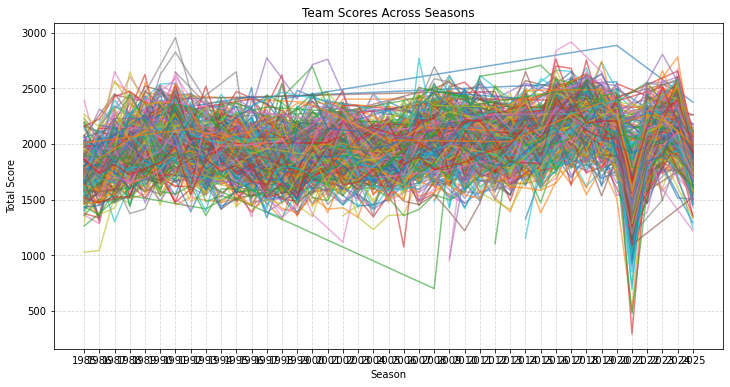

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort data by Season and TeamID
TeamsInRegularSeasonNotInTourney_totals = TeamsInRegularSeasonNotInTourney_totals.sort_values(['TeamID', 'Season'])

# Create the plot
plt.figure(figsize=(12, 6))

# Plot one line per TeamID
for team_id, team_data in TeamsInRegularSeasonNotInTourney_totals.groupby('TeamID'):
    plt.plot(team_data['Season'], team_data['Score'], label=team_id, alpha=0.6)

# Labels and title
plt.xlabel("Season")
plt.ylabel("Total Score")
plt.title("Team Scores Across Seasons")
plt.xticks(sorted(TeamsInRegularSeasonNotInTourney_totals['Season'].unique()))  # Ensure chronological order
plt.grid(True, linestyle="--", alpha=0.5)

# Show the plot
plt.show()

### Wchich Teams did make it to the tournament?

In [47]:
tourney_teams = MNCAATourneySeeds[['Season', 'TeamID']].drop_duplicates()

# Create a DataFrame with scores when teams won
win_scores = MRegularSeasonCompactResults[['Season', 'WTeamID', 'WScore']].rename(
    columns={'WTeamID': 'TeamID', 'WScore': 'Score'}
)

# Create a DataFrame with scores when teams lost
loss_scores = MRegularSeasonCompactResults[['Season', 'LTeamID', 'LScore']].rename(
    columns={'LTeamID': 'TeamID', 'LScore': 'Score'}
)

# Concatenate the two DataFrames to have one row per team per game
all_scores = pd.concat([win_scores, loss_scores], ignore_index=True)

# Group by Season and TeamID to calculate the total score for each team per season
total_scores = all_scores.groupby(['Season', 'TeamID'])['Score'].sum().reset_index()
mean_scores = all_scores.groupby(['Season', 'TeamID'])['Score'].mean().reset_index()
score_stats = pd.merge(total_scores, mean_scores, on=['Season', 'TeamID'], suffixes=('', '_Mean'))

# Filter for teams that are in TeamsInRegularSeasonNotInTourney
TeamsInRegularSeasonInTourney_totals = pd.merge(
    tourney_teams,
    score_stats,
    on=['Season', 'TeamID'],
    how='left'
)

import matplotlib.pyplot as plt
import seaborn as sns

# Sort data by Season and TeamID
TeamsInRegularSeasonNotInTourney_totals = TeamsInRegularSeasonNotInTourney_totals.sort_values(['TeamID', 'Season'])

year = 2010
print('For year ', year)
# In case a team has no score (shouldn't happen if they played), fill with 0
TeamsInRegularSeasonInTourney_totals['Score'] = TeamsInRegularSeasonInTourney_totals['Score'].fillna(0)
print('Min score of team, that did make it into tourney: ',
      min(TeamsInRegularSeasonInTourney_totals['Score'][TeamsInRegularSeasonInTourney_totals['Season']==year]))
print('Max score of team, that did make it into tourney: ',
      max(TeamsInRegularSeasonInTourney_totals['Score'][TeamsInRegularSeasonInTourney_totals['Season']==year]))
print('Min mean score of team, that did make it into tourney: ',
      min(TeamsInRegularSeasonInTourney_totals['Score_Mean'][TeamsInRegularSeasonInTourney_totals['Season']==year]))
TeamsInRegularSeasonInTourney_totals.head()

For year  2010
Min score of team, that did make it into tourney:  1877
Max score of team, that did make it into tourney:  2780
Min mean score of team, that did make it into tourney:  62.56666666666667


,Season,TeamID,Score,Score_Mean
0,1985,1207,2045,75.740741
1,1985,1210,2198,70.903226
2,1985,1228,2115,68.225806
3,1985,1260,2575,85.833333
4,1985,1374,2279,75.966667


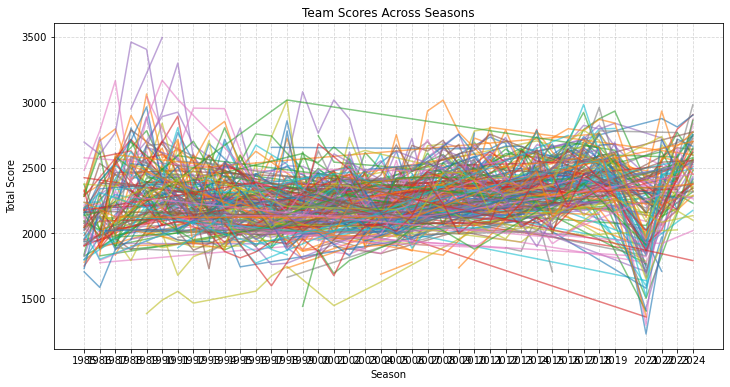

In [48]:
# Create the plot
plt.figure(figsize=(12, 6))
# Plot one line per TeamID
for team_id, team_data in TeamsInRegularSeasonInTourney_totals.groupby('TeamID'):
    plt.plot(team_data['Season'], team_data['Score'], label=team_id, alpha=0.6)
# Labels and title
plt.xlabel("Season")
plt.ylabel("Total Score")
plt.title("Team Scores Across Seasons")
plt.xticks(sorted(TeamsInRegularSeasonInTourney_totals['Season'].unique()))  # Ensure chronological order
plt.grid(True, linestyle="--", alpha=0.5)
# Show the plot
plt.show()

There is no clear score boundary from whitch teams are qualified into the tournament. The teams, who qualify then to have larger score on average though. The mechanism for accepting teams during selection sunday aren't known, or at least I haven't found much, but other than the score from regular season conferences should influence this decision.

### Seed impact on winning

In [38]:
merged_results = pd.merge(
    MNCAATourneyCompactResults,
    MNCAATourneySeeds[['Season', 'Seed', 'TeamID']],
    left_on=['Season', 'WTeamID'],
    right_on=['Season', 'TeamID'],
    how='left'
).rename(columns={'Seed': 'WTeamSeed'}).drop('TeamID', axis=1)

# Merge to get the losing team's seed
TourneySeedResults = pd.merge(
    merged_results,
    MNCAATourneySeeds[['Season', 'Seed', 'TeamID']],
    left_on=['Season', 'LTeamID'],
    right_on=['Season', 'TeamID'],
    how='left'
).rename(columns={'Seed': 'LTeamSeed'}).drop('TeamID', axis=1)

TourneySeedResults['WTeamSeedRaw'] = TourneySeedResults['WTeamSeed'].str.extract('(\d+)')[0].astype(int)
TourneySeedResults['LTeamSeedRaw'] = TourneySeedResults['LTeamSeed'].str.extract('(\d+)')[0].astype(int)

# Extract the letter prefix from WTeamSeed and LTeamSeed
TourneySeedResults['WTeamSeedPrefix'] = TourneySeedResults['WTeamSeed'].str[0]  # First character
TourneySeedResults['LTeamSeedPrefix'] = TourneySeedResults['LTeamSeed'].str[0]  # First character

# Extract the letter prefix from WTeamSeed and LTeamSeed (useful for looking for play-ins)
TourneySeedResults['WTeamSeedSufix'] = TourneySeedResults['WTeamSeed'].str[-1]  # Last character
TourneySeedResults['LTeamSeedSufix'] = TourneySeedResults['LTeamSeed'].str[-1]  # Last character

TourneySeedResults.head()

,Season,DayNum,WTeamID,WScore,LTeamID,LScore,WLoc,NumOT,WTeamSeed,LTeamSeed,WTeamSeedRaw,LTeamSeedRaw,WTeamSeedPrefix,LTeamSeedPrefix,WTeamSeedSufix,LTeamSeedSufix
0,1985,136,1116,63,1234,54,N,0,X09,X08,9,8,X,X,9,8
1,1985,136,1120,59,1345,58,N,0,Z11,Z06,11,6,Z,Z,1,6
2,1985,136,1207,68,1250,43,N,0,W01,W16,1,16,W,W,1,6
3,1985,136,1229,58,1425,55,N,0,Y09,Y08,9,8,Y,Y,9,8
4,1985,136,1242,49,1325,38,N,0,Z03,Z14,3,14,Z,Z,3,4


In tournament win count based on seed


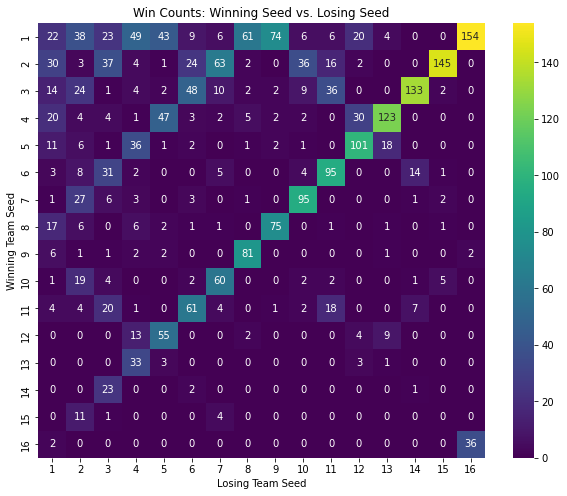

In [41]:
# Create the 16x16 matrix with seed values from 1 to 16
seed_matrix_all = pd.crosstab(TourneySeedResults['WTeamSeedRaw'], TourneySeedResults['LTeamSeedRaw'])
seeds = range(1, 17)
seed_matrix_all = seed_matrix_all.reindex(index=seeds, columns=seeds, fill_value=0)

# If you are in a Jupyter Notebook, simply display the styled DataFrame:
print("In tournament win count based on seed")

# Plot a heatmap with annotations
plt.figure(figsize=(10, 8))
sns.heatmap(seed_matrix_all, annot=True, fmt='d', cmap='viridis')
plt.title('Win Counts: Winning Seed vs. Losing Seed')
plt.xlabel('Losing Team Seed')
plt.ylabel('Winning Team Seed')
plt.show()

In tournament win count based on seed counted internally in region
Note: the diagonal entries are play-ins


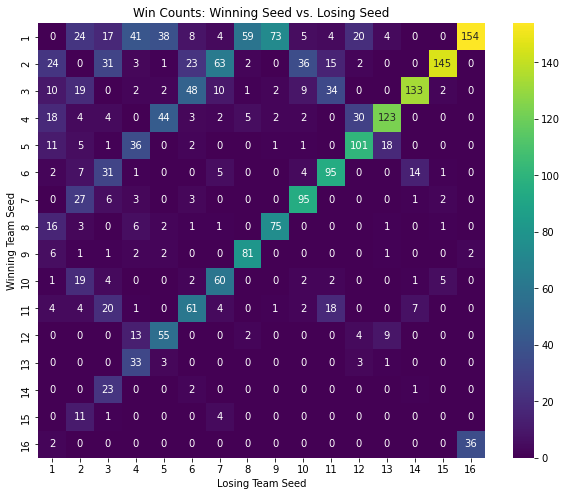

In [42]:
# Filter rows where WTeamSeed and LTeamSeed have different prefixes
filtered_results = TourneySeedResults[TourneySeedResults['WTeamSeedPrefix'] == TourneySeedResults['LTeamSeedPrefix']]

# Create the 16x16 matrix based on the filtered results
seed_matrix_region = pd.crosstab(filtered_results['WTeamSeedRaw'], filtered_results['LTeamSeedRaw'])

# Ensure the matrix includes all seeds from 1 to 16
seeds = range(1, 17)
seed_matrix_region = seed_matrix_region.reindex(index=seeds, columns=seeds, fill_value=0)

print("In tournament win count based on seed counted internally in region")
print("Note: the diagonal entries are play-ins")

# Plot a heatmap with annotations
plt.figure(figsize=(10, 8))
sns.heatmap(seed_matrix_region, annot=True, fmt='d', cmap='viridis')
plt.title('Win Counts: Winning Seed vs. Losing Seed')
plt.xlabel('Losing Team Seed')
plt.ylabel('Winning Team Seed')
plt.show()

In-tournament win count based on seed vs teams from other region
(so only the teams that got to the Final Four stage)


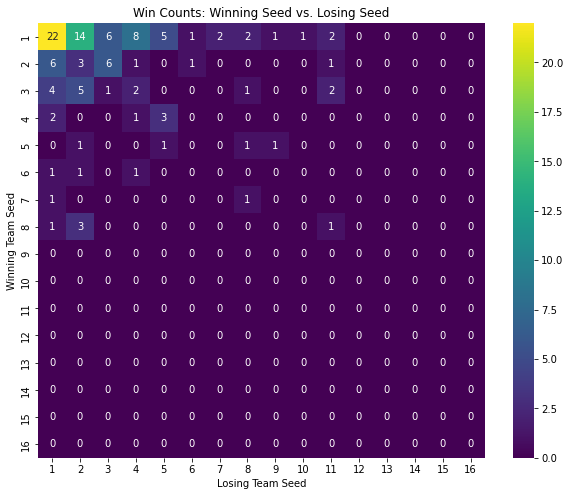

In [45]:
seed_matrix_external = seed_matrix_all - seed_matrix_region

# If you are in a Jupyter Notebook, simply display the styled DataFrame:
print("In-tournament win count based on seed vs teams from other region")
print("(so only the teams that got to the Final Four stage)")

# Plot a heatmap with annotations
plt.figure(figsize=(10, 8))
sns.heatmap(seed_matrix_external, annot=True, fmt='d', cmap='viridis')
plt.title('Win Counts: Winning Seed vs. Losing Seed')
plt.xlabel('Losing Team Seed')
plt.ylabel('Winning Team Seed')
plt.show()

Lower seeds (1 especially) get to the championship games (out of region).

Scores from tournament


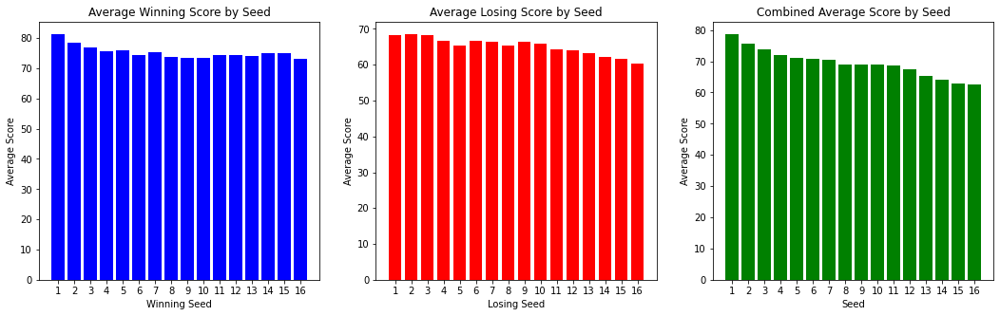

In [15]:
# Compute average score for winning teams grouped by winning seed
avg_win = TourneySeedResults.groupby('WTeamSeedRaw')['WScore'].mean().sort_index()

# Compute average score for losing teams grouped by losing seed
avg_loss = TourneySeedResults.groupby('LTeamSeedRaw')['LScore'].mean().sort_index()

# For combined average: combine winning and losing scores into one dataframe.
winning_scores = TourneySeedResults[['WTeamSeedRaw', 'WScore']].rename(columns={'WTeamSeedRaw':'Seed', 'WScore':'Score'})
losing_scores  = TourneySeedResults[['LTeamSeedRaw', 'LScore']].rename(columns={'LTeamSeedRaw':'Seed', 'LScore':'Score'})
combined_scores = pd.concat([winning_scores, losing_scores], ignore_index=True)

avg_combined = combined_scores.groupby('Seed')['Score'].mean().sort_index()

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Winning seeds only
axes[0].bar(avg_win.index, avg_win.values, color='blue')
axes[0].set_title('Average Winning Score by Seed')
axes[0].set_xlabel('Winning Seed')
axes[0].set_ylabel('Average Score')
axes[0].set_xticks(range(1, 17))

# Plot 2: Losing seeds only
axes[1].bar(avg_loss.index, avg_loss.values, color='red')
axes[1].set_title('Average Losing Score by Seed')
axes[1].set_xlabel('Losing Seed')
axes[1].set_ylabel('Average Score')
axes[1].set_xticks(range(1, 17))

# Plot 3: Combined seeds (winning + losing)
axes[2].bar(avg_combined.index, avg_combined.values, color='green')
axes[2].set_title('Combined Average Score by Seed')
axes[2].set_xlabel('Seed')
axes[2].set_ylabel('Average Score')
axes[2].set_xticks(range(1, 17))

print("Scores from tournament")
plt.show()

In [31]:
TourneySeedResults[TourneySeedResults['DayNum'] == 154].groupby('WTeamSeedRaw').size().reset_index(name='count')
# 154 is always the final day

,WTeamSeedRaw,count
0,1,25
1,2,5
2,3,4
3,4,2
4,6,1
5,7,1
6,8,1


So historically only the 8 best seeds have ever won and the lower seeds are very favoured in matchmaking.

### Team vs team win fraction

Performance in Tourney


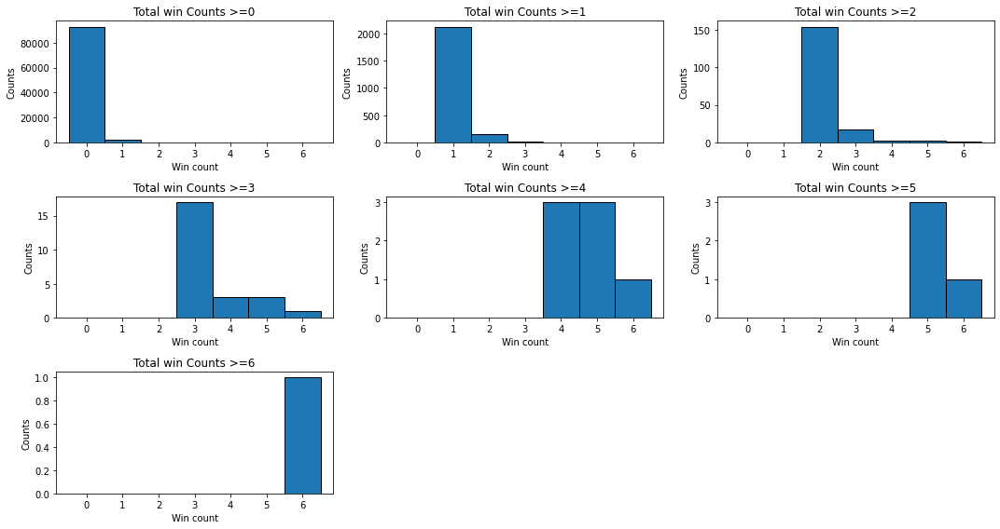

In [117]:
print('Performance in Tourney')

MTeamVsTeamWinCount = MNCAATourneyCompactResults.groupby(['WTeamID', 'LTeamID']).size().reset_index(name='count')
MTeamVsTeamWinCount = MTeamVsTeamWinCount.sort_values(by=['WTeamID', 'LTeamID'])

teams = pd.unique(MTeamVsTeamWinCount[['WTeamID', 'LTeamID']].values.ravel())
all_matchups = pd.DataFrame(itertools.product(teams, teams), columns=['WTeamID', 'LTeamID'])
all_matchups = all_matchups[all_matchups['WTeamID'] != all_matchups['LTeamID']]

MTeamVsTeamWinCount = all_matchups.merge(MTeamVsTeamWinCount, on=['WTeamID', 'LTeamID'], how='left').fillna(0)
MTeamVsTeamWinCount['count'] = MTeamVsTeamWinCount['count'].astype(int)
max_win_count = max(MTeamVsTeamWinCount['count'])

plt.figure(figsize=(15, 8))
for i in range(max_win_count + 1):
    tmp = MTeamVsTeamWinCount[MTeamVsTeamWinCount['count'] >= i]
    plt.subplot(math.ceil(max_win_count / 2),
                math.floor(max_win_count / 2 - 1) + 1,
                i + 1)
    bins = np.arange(max_win_count + 2) - 0.5
    hist_values, bin_edges, _ = plt.hist(tmp['count'], bins=bins, edgecolor='black')
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    plt.xticks(bin_centers, labels=[f"{x:.0f}" for x in bin_centers])
    plt.xlabel('Win count')
    plt.ylabel('Counts')
    plt.title(f'Total win Counts >={i}')

plt.tight_layout()
plt.show()

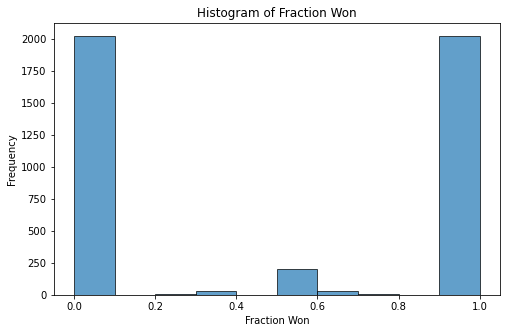

In [119]:
MTeamVsTeamWinCount["TeamPair"] = MTeamVsTeamWinCount.apply(lambda row: tuple(sorted([row["WTeamID"], row["LTeamID"]])), axis=1)

# Aggregate the total games played for each team pair
MTeamVsTeamWinCount["TotalGames"] = MTeamVsTeamWinCount.groupby("TeamPair")["count"].transform("sum")

# Drop the temporary TeamPair column if not needed
MTeamVsTeamWinCount = MTeamVsTeamWinCount.drop(columns=["TeamPair"])

MTeamVsTeamWinCount["FractionWon"] = MTeamVsTeamWinCount["count"] / MTeamVsTeamWinCount["TotalGames"]

MTeamVsTeamWinFraction = MTeamVsTeamWinCount[MTeamVsTeamWinCount["TotalGames"] > 0]

plt.figure(figsize=(8, 5))
plt.hist(MTeamVsTeamWinFraction["FractionWon"], bins=10, edgecolor='black', alpha=0.7)

# Labeling
plt.xlabel("Fraction Won")
plt.ylabel("Frequency")
plt.title("Histogram of Fraction Won")

# Show the plot
plt.show()

Performance in Regular Season
Max win count:  84


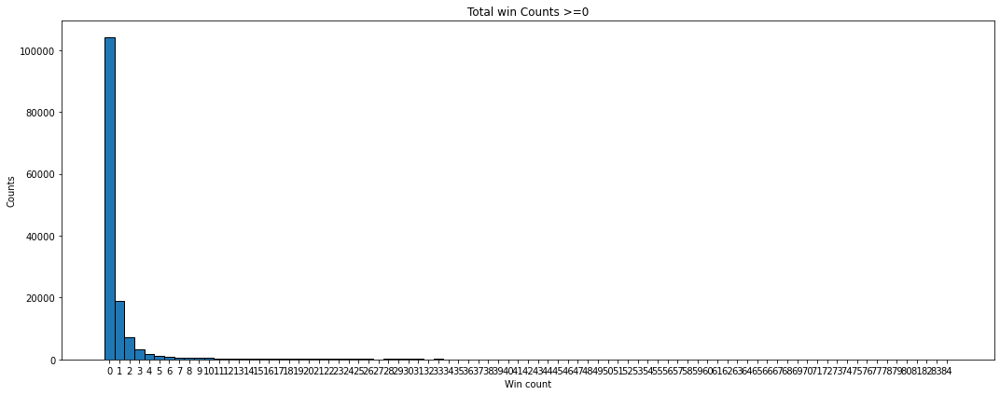

In [120]:
print('Performance in Regular Season')

MTeamVsTeamWinCount = MRegularSeasonCompactResults.groupby(['WTeamID', 'LTeamID']).size().reset_index(name='count')
MTeamVsTeamWinCount = MTeamVsTeamWinCount.sort_values(by=['WTeamID', 'LTeamID'])

teams = pd.unique(MTeamVsTeamWinCount[['WTeamID', 'LTeamID']].values.ravel())
all_matchups = pd.DataFrame(itertools.product(teams, teams), columns=['WTeamID', 'LTeamID'])
all_matchups = all_matchups[all_matchups['WTeamID'] != all_matchups['LTeamID']]

MTeamVsTeamWinCount = all_matchups.merge(MTeamVsTeamWinCount, on=['WTeamID', 'LTeamID'], how='left').fillna(0)
MTeamVsTeamWinCount['count'] = MTeamVsTeamWinCount['count'].astype(int)

max_win_count = max(MTeamVsTeamWinCount['count'])
print('Max win count: ', max_win_count)

# **Fix: Use plt.subplots()**
fig, axes = plt.subplots(1, 1, figsize=(15, 6))  # 1 row, 2 columns

tmp = MTeamVsTeamWinCount[MTeamVsTeamWinCount['count'] >= 0]
bins = np.arange(max_win_count + 2) - 0.5
hist_values, bin_edges, _ = plt.hist(tmp['count'], bins=bins, edgecolor='black')

bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
plt.xticks(bin_centers, labels=[f"{x:.0f}" for x in bin_centers])

plt.xlabel('Win count')
plt.ylabel('Counts')
plt.title(f'Total win Counts >={0}')

plt.tight_layout()
plt.show()

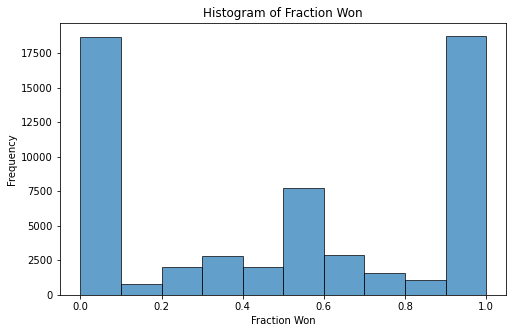

In [121]:
MTeamVsTeamWinCount["TeamPair"] = MTeamVsTeamWinCount.apply(lambda row: tuple(sorted([row["WTeamID"], row["LTeamID"]])), axis=1)

# Aggregate the total games played for each team pair
MTeamVsTeamWinCount["TotalGames"] = MTeamVsTeamWinCount.groupby("TeamPair")["count"].transform("sum")

# Drop the temporary TeamPair column if not needed
MTeamVsTeamWinCount = MTeamVsTeamWinCount.drop(columns=["TeamPair"])

MTeamVsTeamWinCount["FractionWon"] = MTeamVsTeamWinCount["count"] / MTeamVsTeamWinCount["TotalGames"]

MTeamVsTeamWinFraction = MTeamVsTeamWinCount[MTeamVsTeamWinCount["TotalGames"] > 0]

plt.figure(figsize=(8, 5))
plt.hist(MTeamVsTeamWinFraction["FractionWon"], bins=10, edgecolor='black', alpha=0.7)

# Labeling
plt.xlabel("Fraction Won")
plt.ylabel("Frequency")
plt.title("Histogram of Fraction Won")

# Show the plot
plt.show()

### How teams IDs are given

In [23]:
df = MTeams
print("Team IDs")
print('max number:', max(df['TeamID']))
print('min number:', min(df['TeamID']))
print('missng team numbers from sequence: ', sorted(set(range(min(df['TeamID']), max(df['TeamID'])+1)) - set(df['TeamID'])))

Team IDs
max number: 1480
min number: 1101
missng team numbers:  []


### How consistent are certain teams

In [5]:
df = MRegularSeasonDetailedResults

# --- Step 1. Identify the extra columns (from 'NumOT' onward) ---
cols = df.columns.tolist()
start_index = cols.index('NumOT')
extra_columns = cols[start_index:]
# extra_columns now holds the list of columns for which we want the mean

# --- Step 2. Aggregate winning and losing records separately ---

# For wins: group by Season and winning team (WTeamID)
wins_agg = df.groupby(['Season', 'WTeamID']).agg(
    wins_count=('WTeamID', 'size'),
    mean_winning_score=('WScore', 'mean')
).reset_index().rename(columns={'WTeamID': 'TeamID'})

# For losses: group by Season and losing team (LTeamID)
losses_agg = df.groupby(['Season', 'LTeamID']).agg(
    losses_count=('LTeamID', 'size'),
    mean_losing_score=('LScore', 'mean')
).reset_index().rename(columns={'LTeamID': 'TeamID'})

# --- Step 3. Overall game-level aggregation for the extra columns and overall mean score ---
# Create two dataframes—one for wins and one for losses—with the extra columns.
wins_extra = df[['Season', 'WTeamID'] + extra_columns].rename(columns={'WTeamID': 'TeamID'})
losses_extra = df[['Season', 'LTeamID'] + extra_columns].rename(columns={'LTeamID': 'TeamID'})

# Combine both so that each game appears once per team
all_extra = pd.concat([wins_extra, losses_extra], ignore_index=True)
overall_extra = all_extra.groupby(['Season', 'TeamID']).mean().reset_index()

# For the overall score, combine the scores from wins and losses.
wins_score = df[['Season', 'WTeamID', 'WScore']].rename(
    columns={'WTeamID': 'TeamID', 'WScore': 'Score'}
)
losses_score = df[['Season', 'LTeamID', 'LScore']].rename(
    columns={'LTeamID': 'TeamID', 'LScore': 'Score'}
)
all_scores = pd.concat([wins_score, losses_score], ignore_index=True)
overall_scores = all_scores.groupby(['Season', 'TeamID']).agg(
    total_score_sum=('Score', 'sum'),
    total_games=('Score', 'size')
).reset_index()
overall_scores['mean_score'] = overall_scores['total_score_sum'] / overall_scores['total_games']

# --- Step 4. Merge the wins and losses aggregates ---
agg = pd.merge(wins_agg, losses_agg, on=['Season', 'TeamID'], how='outer')

# Fill missing win/loss counts with 0 (teams that only lost or only won)
agg['wins_count'] = agg['wins_count'].fillna(0)
agg['losses_count'] = agg['losses_count'].fillna(0)
agg['total_games'] = agg['wins_count'] + agg['losses_count']

# Compute fractions for wins and losses
agg['fraction_wins'] = agg['wins_count'] / agg['total_games']
agg['fraction_losses'] = agg['losses_count'] / agg['total_games']

# --- Step 5. Merge overall score and extra columns ---
agg = pd.merge(agg, overall_scores[['Season', 'TeamID', 'mean_score']], on=['Season', 'TeamID'], how='outer')
final_df = pd.merge(agg, overall_extra, on=['Season', 'TeamID'], how='outer')

# --- Step 6. Rearrange columns in the desired order ---
final_df = final_df[['Season', 'TeamID', 'fraction_wins', 'fraction_losses',
                     'mean_winning_score', 'mean_losing_score', 'mean_score'] + extra_columns]

print('fraction of wins / losses, means of other parameters')
# Display the resulting dataframe
final_df.head()

fraction of wins / losses, means of other parameters


,Season,TeamID,fraction_wins,fraction_losses,mean_winning_score,mean_losing_score,mean_score,NumOT,WFGM,WFGA,...,LFGA3,LFTM,LFTA,LOR,LDR,LAst,LTO,LStl,LBlk,LPF
0,2003,1102,0.428571,0.571429,68.750000,48.625000,57.250000,0.000000,20.821429,39.571429,...,17.642857,9.785714,14.428571,7.071429,16.250000,9.035714,12.750000,5.357143,0.964286,20.535714
1,2003,1103,0.481481,0.518519,87.769231,70.428571,78.777778,0.296296,28.962963,54.777778,...,18.962963,16.444444,22.148148,11.703704,19.259259,13.296296,14.296296,6.851852,2.629630,22.074074
2,2003,1104,0.607143,0.392857,74.705882,60.909091,69.285714,0.035714,25.500000,56.000000,...,19.178571,11.928571,16.821429,12.178571,21.785714,10.178571,14.535714,5.357143,2.785714,20.321429
3,2003,1105,0.269231,0.730769,79.428571,68.947368,71.769231,0.153846,27.692308,60.115385,...,19.423077,14.576923,21.269231,13.115385,22.500000,13.615385,19.730769,8.192308,2.615385,20.384615
4,2003,1106,0.464286,0.535714,68.307692,59.533333,63.607143,0.035714,24.500000,53.321429,...,16.750000,12.250000,17.607143,11.678571,19.964286,9.928571,16.214286,8.035714,2.535714,18.071429


In [7]:
# Step 1: Identify extra columns starting from 'NumOT'
cols = MRegularSeasonCompactResults.columns.tolist()
start_index = cols.index('NumOT')
extra_columns = cols[start_index:]

# Step 2: Create a long-form DataFrame from raw game data for wins and losses
wins_df = MRegularSeasonCompactResults[['Season', 'WTeamID', 'WScore'] + extra_columns].copy()
wins_df = wins_df.rename(columns={'WTeamID': 'TeamID', 'WScore': 'Score'})
wins_df['win_flag'] = 1

losses_df = MRegularSeasonCompactResults[['Season', 'LTeamID', 'LScore'] + extra_columns].copy()
losses_df = losses_df.rename(columns={'LTeamID': 'TeamID', 'LScore': 'Score'})
losses_df['win_flag'] = 0

# Concatenate wins and losses into a single DataFrame
long_df = pd.concat([wins_df, losses_df], ignore_index=True)

# Step 3: Compute standard deviation on raw game data for each team (ignoring Season)

# Overall standard deviation of the score (from all games)
std_total_score = long_df.groupby('TeamID')['Score'].std().reset_index().rename(columns={'Score': 'std_total_score'})

# Standard deviation of win indicator (binary: 1 for win, 0 for loss)
std_win_flag = long_df.groupby('TeamID')['win_flag'].std().reset_index().rename(columns={'win_flag': 'std_win_flag'})

# Standard deviation of winning scores (only on wins)
std_winning_score = wins_df.groupby('TeamID')['Score'].std().reset_index().rename(columns={'Score': 'std_winning_score'})

# Standard deviation of losing scores (only on losses)
std_losing_score = losses_df.groupby('TeamID')['Score'].std().reset_index().rename(columns={'Score': 'std_losing_score'})

# Standard deviations for the extra columns (from 'NumOT' onward) across all games
std_extra = long_df.groupby('TeamID')[extra_columns].std().reset_index()

# Merge all standard deviation calculations on TeamID (ignoring Season)
raw_std_in_seasonstd_df = std_total_score.merge(std_win_flag, on='TeamID', how='outer') \
    .merge(std_winning_score, on='TeamID', how='outer') \
    .merge(std_losing_score, on='TeamID', how='outer') \
    .merge(std_extra, on='TeamID', how='outer')

print('std of raw values')
# raw_std_df now contains TeamID and the standard deviations of the raw data metrics.
raw_std_in_seasonstd_df.head()

std of raw values


,TeamID,std_total_score,std_win_flag,std_winning_score,std_losing_score,NumOT
0,1101,11.931218,0.499884,8.113678,11.495789,0.320089
1,1102,12.136450,0.479471,11.850982,10.335667,0.243537
2,1103,12.291633,0.492515,10.857103,10.825376,0.266008
3,1104,13.056490,0.482602,12.450349,10.200421,0.285332
4,1105,12.391173,0.476859,11.048283,10.594939,0.328072


In [9]:
# Group by TeamID and compute standard deviation (ignoring Season)
std_mean_season = final_df.groupby('TeamID').std().reset_index()

# Rename the columns to indicate standard deviation
std_mean_season = std_mean_season.rename(columns={col: f"{col}_std" for col in std_mean_season.columns if col != 'TeamID'})

print("std of the mean per season, std of fraction of wins / losses")
std_mean_season.head()

std of the mean per season, std of fraction of wins / losses


,TeamID,Season_std,fraction_wins_std,fraction_losses_std,mean_winning_score_std,mean_losing_score_std,mean_score_std,NumOT_std,WFGM_std,WFGA_std,...,LFGA3_std,LFTM_std,LFTA_std,LOR_std,LDR_std,LAst_std,LTO_std,LStl_std,LBlk_std,LPF_std
0,1101,3.605551,0.217339,0.217339,1.914375,3.406443,4.291418,0.060886,0.643919,2.249740,...,1.580100,2.048921,2.401151,0.797662,1.578799,1.156071,1.919112,0.903986,0.655485,1.100463
1,1102,6.782330,0.171020,0.171020,5.345238,5.488994,4.765477,0.040691,2.296467,5.015475,...,2.573523,1.290292,1.943482,1.295292,2.412251,1.441913,1.059460,0.520334,0.585501,1.156608
2,1103,6.782330,0.108017,0.108017,4.423857,3.716268,3.960763,0.068028,1.690424,2.763002,...,2.827639,1.471371,1.797817,1.754076,1.630498,1.284712,1.578124,0.776327,0.349569,1.195069
3,1104,6.782330,0.111773,0.111773,7.842676,5.992397,7.612614,0.048904,2.434801,4.189885,...,3.354974,1.752719,2.295525,1.261851,1.282855,1.108919,1.170794,0.887826,0.541961,1.262122
4,1105,6.782330,0.120680,0.120680,4.724295,4.306932,4.220983,0.051831,1.501945,2.423329,...,2.020248,2.066282,2.869323,1.792859,1.535935,1.150972,2.135773,1.366206,1.040784,1.605426


### How many years back are results consistent

C:\Users\Sebastian\anaconda3\lib\site-packages\numpy\lib\function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
C:\Users\Sebastian\anaconda3\lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)


Average autocorrelation for 'fraction_wins' by lag:
Lag 1: 0.280
Lag 2: 0.098
Lag 3: -0.022
Lag 4: -0.035
Lag 5: -0.035


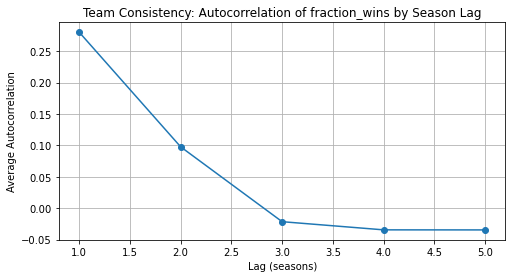

Based on a threshold of 0.2, results are consistent up to 1 season(s) back.


In [12]:
def compute_autocorrelations(df, metric, max_lag):
    """
    Compute the average autocorrelation for a given metric over different lags.

    Parameters:
        df (DataFrame): DataFrame with season-level team data.
        metric (str): The column name to compute autocorrelation on.
        max_lag (int): Maximum lag (in seasons) to compute.

    Returns:
        dict: Dictionary mapping lag -> average autocorrelation (across teams).
    """
    autocorr_by_lag = {}
    teams = df['TeamID'].unique()
    for lag in range(1, max_lag+1):
        ac_list = []
        for team in teams:
            team_data = df[df['TeamID'] == team].sort_values('Season')
            if len(team_data) > lag:
                ac = team_data[metric].autocorr(lag=lag)
                if not np.isnan(ac):
                    ac_list.append(ac)
        # Average the autocorrelations for this lag across teams
        autocorr_by_lag[lag] = np.mean(ac_list) if ac_list else np.nan
    return autocorr_by_lag

df = final_df # from 1st cell previous section

# Determine the maximum lag to consider: e.g. the smallest maximum number of seasons available among teams or a fixed number.
max_possible_lag = df.groupby('TeamID')['Season'].count().max() - 1
max_lag = min(5, max_possible_lag) if max_possible_lag >= 1 else 1

# Compute average autocorrelations for the 'fraction_wins' metric.
avg_ac = compute_autocorrelations(df, 'fraction_wins', max_lag)

print("Average autocorrelation for 'fraction_wins' by lag:")
for lag, ac in avg_ac.items():
    print(f"Lag {lag}: {ac:.3f}")

# Plot the average autocorrelation vs. lag.
lags = list(avg_ac.keys())
ac_values = list(avg_ac.values())

plt.figure(figsize=(8, 4))
plt.plot(lags, ac_values, marker='o')
plt.xlabel("Lag (seasons)")
plt.ylabel("Average Autocorrelation")
plt.title("Team Consistency: Autocorrelation of fraction_wins by Season Lag")
plt.grid(True)
plt.show()

# Determine up to how many seasons back results are consistent.
# For example, we can say results are consistent if the average autocorrelation is above a threshold.
threshold = 0.2
consistent_lags = [lag for lag, ac in avg_ac.items() if ac >= threshold]
max_consistent = max(consistent_lags) if consistent_lags else 0

print(f"Based on a threshold of {threshold}, results are consistent up to {max_consistent} season(s) back.")


Obviously the college teams change rapidly. The highest autocorrelation is one season back, no surprises here.

# Feature engineering

## Data preparation pipeline

In [3]:
def prepare_data(df):

    """
    This function duplicates and flips a game record.
    Now two records with the same data are present,
    but viewed from perspectives of two different teams.
    """

    df = df[[
         'Season', 'DayNum', 'NumOT',
         'WTeamID',  'WScore', 'WLoc',
         'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR', 'WAst', 'WTO', 'WStl', 'WBlk', 'WPF',
         'LTeamID', 'LScore',
         'LFGM', 'LFGA', 'LFGM3', 'LFGA3', 'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF'
    ]]
    dfswap = df[[
         'Season', 'DayNum', 'NumOT',
         'LTeamID', 'LScore', 'WLoc',
         'LFGM', 'LFGA', 'LFGM3', 'LFGA3', 'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF',
         'WTeamID',  'WScore',
         'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR', 'WAst', 'WTO', 'WStl', 'WBlk', 'WPF',
    ]].copy()

    dfswap.loc[df['WLoc'] == 'H', 'WLoc'] = 'A'
    dfswap.loc[df['WLoc'] == 'A', 'WLoc'] = 'H'

    df = df.rename(columns={'WLoc': 'location'})
    dfswap = dfswap.rename(columns={'WLoc': 'location'})

    df.columns = [x.replace('W','T1_').replace('L','T2_') for x in list(df.columns)]
    dfswap.columns = [x.replace('L','T1_').replace('W','T2_') for x in list(dfswap.columns)]

    output = pd.concat([df, dfswap]).reset_index(drop=True)
    output.loc[output.location=='N','location'] = '0'
    output.loc[output.location=='H','location'] = '1'
    output.loc[output.location=='A','location'] = '-1'
    output.location = output.location.astype(int)

    output['PointDiff'] = output['T1_Score'] - output['T2_Score']

    return output

def get_data(regular_results, tourney_results, seeds, prepared=False, location_multiplier=[1, 1], win_ratio_days_back=14):

    """
    This function uses the prepare_data function in order to create
    a data frame with season statistics for each team.
    These statistics are added to records with games played in
    tournament to make data 'x' used in model to predict the game
    result 'y'. The output is a data frame that contains data 'x'
    and also label 'y' can be easily calculated based on score difference in matches.
    """

    if prepared:
        regular_data = regular_results.copy()
        tourney_data = tourney_results.copy()
    else:
        # make data frames with extra rows to represent the perspective of losing team
        regular_data = prepare_data(regular_results)
        tourney_data = prepare_data(tourney_results)

    # ----------------------------------- Add reward/penalty for playing in home or away
    if location_multiplier[0] == 1 and location_multiplier[1] == 1:
        # data frame with mean game statistics for a given team in a given season
        season_statistics  = regular_data.groupby(["Season", 'T1_TeamID'])[
            [
                'T1_Score', 'T1_FGM','T1_FGA','T1_FGM3','T1_FGA3','T1_FTM','T1_FTA',
                'T1_OR','T1_DR','T1_Ast','T1_TO','T1_Stl','T1_Blk','T1_PF',
                'T2_Score', 'T2_FGM','T2_FGA','T2_FGM3','T2_FGA3','T2_FTM','T2_FTA',
                'T2_OR','T2_DR','T2_Ast','T2_TO','T2_Stl','T2_Blk','T2_PF',
                'PointDiff'
            ]
        ].agg('mean').reset_index()
    else:
        # Define which columns to adjust (you can add or remove columns as needed)
        T1_cols = ['T1_Score','T1_FGM','T1_FGA','T1_FGM3','T1_FGA3','T1_FTM','T1_FTA','T1_OR','T1_DR','T1_Ast','T1_TO','T1_Stl','T1_Blk','T1_PF']
        T2_cols = ['T2_Score','T2_FGM','T2_FGA','T2_FGM3','T2_FGA3','T2_FTM','T2_FTA','T2_OR','T2_DR','T2_Ast','T2_TO','T2_Stl','T2_Blk','T2_PF']

        # Convert the relevant columns to float before applying the adjustment function.
        cols_to_float = T1_cols + T2_cols
        regular_data[cols_to_float] = regular_data[cols_to_float].astype(float)

        def adjust_stats(row):
            # Determine multipliers based on location
            if row['location'] == 1:
                factor_T1 = location_multiplier[0]  # penalize Team1 stats (home)
                factor_T2 = location_multiplier[1]  # boost Team2 stats
            elif row['location'] == -1:
                factor_T1 = location_multiplier[1]  # boost Team1 stats (away)
                factor_T2 = location_multiplier[0]  # penalize Team2 stats
            else:
                factor_T1 = 1.0
                factor_T2 = 1.0

            # Adjust Team1 stats
            for col in T1_cols:
                if col in row and pd.notnull(row[col]):
                    row[col] = row[col] * factor_T1

            # Adjust Team2 stats
            for col in T2_cols:
                if col in row and pd.notnull(row[col]):
                    row[col] = row[col] * factor_T2

            # Recalculate derived statistics (if needed)
            if 'T1_Score' in row and 'T2_Score' in row:
                row['PointDiff'] = row['T1_Score'] - row['T2_Score']
            return row

        # Apply the adjustment function row-wise.
        regular_data_adjusted = regular_data.apply(adjust_stats, axis=1)

        # Now group by Season and T1_TeamID to compute season averages for the adjusted statistics.
        stats_columns = T1_cols[1:] + T2_cols[1:] + ['PointDiff']  # Exclude T1_TeamID from stats if present.
        season_statistics = regular_data_adjusted.groupby(["Season", 'T1_TeamID'])[stats_columns].agg('mean').reset_index()
    # -----------------------------------

    # mean statistics for team and team's opponent's
    season_statistics_T1 = season_statistics.copy()
    season_statistics_T2 = season_statistics.copy()

    season_statistics_T1.columns = ["T1_" + x.replace("T1_","").replace("T2_","opponent_") for x in list(season_statistics_T1.columns)]
    season_statistics_T2.columns = ["T2_" + x.replace("T1_","").replace("T2_","opponent_") for x in list(season_statistics_T2.columns)]
    season_statistics_T1.columns.values[0] = "Season"
    season_statistics_T2.columns.values[0] = "Season"
    season_statistics_T1 = season_statistics_T1.rename(columns={'T1_Score': 'T1_Score_mean'})
    season_statistics_T2 = season_statistics_T2.rename(columns={'T2_Score': 'T2_Score_mean'})

    # data frame containing game's result
    tourney_data = tourney_data[['Season', 'DayNum', 'T1_TeamID', 'T1_Score', 'T2_TeamID' ,'T2_Score', 'location']]
    tourney_data = pd.merge(tourney_data, season_statistics_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, season_statistics_T2, on = ['Season', 'T2_TeamID'], how = 'left')

    calculate_win_ratio_days_back = 132 - win_ratio_days_back

    # data frame with win fraction from last x days for a given team in a given season
    last14days_stats_T1 = regular_data.loc[regular_data.DayNum>calculate_win_ratio_days_back].reset_index(drop=True)
    last14days_stats_T1['win'] = np.where(last14days_stats_T1['PointDiff']>0,1,0)
    last14days_stats_T1 = last14days_stats_T1.groupby(['Season','T1_TeamID'])['win'].mean().reset_index(name='T1_win_ratio_14d')

    last14days_stats_T2 = regular_data.loc[regular_data.DayNum>calculate_win_ratio_days_back].reset_index(drop=True)
    last14days_stats_T2['win'] = np.where(last14days_stats_T2['PointDiff']<0,1,0)
    last14days_stats_T2 = last14days_stats_T2.groupby(['Season','T2_TeamID'])['win'].mean().reset_index(name='T2_win_ratio_14d')

    # add to tourney_data column with win fraction for winning and losing team
    tourney_data = pd.merge(tourney_data, last14days_stats_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, last14days_stats_T2, on = ['Season', 'T2_TeamID'], how = 'left')

    # get seeds with no regional division
    seeds['seed'] = seeds['Seed'].apply(lambda x: int(x[1:3]))

    # give each team a raw seed
    seeds_T1 = seeds[['Season','TeamID','seed']].copy()
    seeds_T2 = seeds[['Season','TeamID','seed']].copy()
    seeds_T1.columns = ['Season','T1_TeamID','T1_seed']
    seeds_T2.columns = ['Season','T2_TeamID','T2_seed']

    # add seeds to turney data for team 1 and team 2
    tourney_data = pd.merge(tourney_data, seeds_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, seeds_T2, on = ['Season', 'T2_TeamID'], how = 'left')

    # add a seed difference column
    tourney_data["Seed_diff"] = tourney_data["T1_seed"] - tourney_data["T2_seed"]

    return tourney_data

def get_df(seeds,
            season_games, season_range, days_back,
            tourney_games, tourney_range,
            location_multiplier=[1, 1],
           win_ratio_days_back=14):

    """
    This function uses get_data function to get a data
    frame which is then used to make 'x' and 'y' data
    used in models.
    """

    # Get from regular season games from specified season range and days back
    # The results of those games will be used as team statictics (additional team information for tourney games)
    regular_results = season_games[season_games['Season'].isin(season_range)]
    regular_results = regular_results[regular_results['DayNum'] > 134 - days_back]

    # Get tourney games from a specified season
    # The results of those games will be used as labels
    tourney_results = tourney_games[tourney_games['Season'].isin(tourney_range)]

    # Get final data frame
    df = get_data(regular_results, tourney_results, seeds, location_multiplier=[1, 1], win_ratio_days_back=win_ratio_days_back)

    return df

def get_final_df(seeds,
                   season_games, season_range, days_back,
                   tourney_games, tourney_range,
                   SampleSubmissionStage1,
                  location_multiplier=[1, 1],
                win_ratio_days_back=14):

    """
    This function works the same as function get_x_y,
    but also creates (at the moment it's the same as get_x_y)
    aditional data points mostly with NaN values that matches
    the submission format (parsed team matchups with the sample submission file).
    """

    # Get from regular season games from specified season range and days back
    # The results of those games will be used as team statictics (additional team information for tourney games)
    regular_results = season_games[season_games['Season'].isin(season_range)]
    regular_results = regular_results[regular_results['DayNum'] > 134 - days_back]

    # Get tourney games from a specified season
    # The results of those games will be used as labels
    tourney_results = tourney_games[tourney_games['Season'].isin(tourney_range)]

    # Assume sample_submission is a DataFrame with an "ID" column like "2023_1101_1102"
    # and tourney_results is a DataFrame with columns including: Season, WTeamID, LTeamID, DayNum, WScore, LScore, WLoc, etc.
    # Filter rows where the ID starts with the specified season (followed by an underscore)
    final_season = tourney_range[0]
    sample_submission_copy = SampleSubmissionStage1.copy()
    sample_submission = sample_submission_copy[sample_submission_copy['ID'].str.startswith(f"{final_season}_")]
    sample_submission = sample_submission.drop(columns=['Pred'])

    sample_submission[['Season', 'Team1', 'Team2']] = sample_submission['ID'].str.split('_', expand=True)
    sample_submission['Season'] = sample_submission['Season'].astype(float)
    sample_submission['Team1'] = sample_submission['Team1'].astype(float)
    sample_submission['Team2'] = sample_submission['Team2'].astype(float)

    regular_data_final = prepare_data(regular_results)
    tourney_data_final  = prepare_data(tourney_results)

    tourney_data =  get_data(regular_data_final, tourney_data_final,
                             seeds, prepared=True,
                          win_ratio_days_back=win_ratio_days_back)
    tourney_data = pd.merge(
        sample_submission,
        tourney_data,
        left_on=['Season', 'Team1', 'Team2'],
        right_on=['Season', 'T1_TeamID', 'T2_TeamID'],
        how='left'
    )
    tourney_data['T1_TeamID'] = tourney_data['Team1']
    tourney_data['T2_TeamID'] = tourney_data['Team2']
    tourney_data = tourney_data.drop(['ID', 'Team1', 'Team2'], axis=1)

    return tourney_data

def correct_predictions_based_on_seed(x, y, maximum_favoured_seed = 4, number_of_added_columns=1):
    """
    Sets the winnning chance to 1 or 0 based on the seed difference.
    """
    for i in range(len(x)):
        if x[i][-1-number_of_added_columns] <= (-16 + maximum_favoured_seed * 2 - 1):
            y[i] = 1
        elif x[i][-1-number_of_added_columns] >= (16 - maximum_favoured_seed * 2 + 1):
            y[i] = 0
    return y

def clear_na_from_x_y(x, y):
    """
    The data frame for final season is in format matching the submission file.
    This function clears NaNs from data.
    """
    # Create masks for training data:
    mask_train = ~np.isnan(x).any(axis=1) & ~np.isnan(y)
    x_clean = x[mask_train]
    y_clean = y[mask_train]
    return x_clean, y_clean

def x_y_from_data_frame(df):
    # Prepare data and labels
    x = df[list(df.columns[7:])].values
    y = np.where(
        df[['T1_Score', 'T2_Score']].isnull().any(axis=1),
        np.nan,
        np.where(df['T1_Score'] - df['T2_Score'] > 0, 1, 0)
    )
    return x, y

def get_all_core_data(
    regular_results, tourney_results, seeds, SampleSubmissionStage1,
    final_season = 2024, # the season we want to predict, so for out submission it will be 2025
    start_season = 2005, # from which ponit should we begin creating data
    season_years_list  = [[i-1, i] for i in range(2005, 2024+1)], # at which seasons to look at when calculating team's stats
    days_back = 15, # how many days back from the start of tourney to calculate team's stats per season
    maximum_favoured_seed = 4, # Set the predicted probability of winning to 1 for seeds <= maximum_favoured_seed and to 0 for >= 16-maximum_favoured_seed
    location_multiplier=[0.95, 1.05], # home penalty, away bonus
    include_men = True, # include M... data sets when preparing x and y
    include_women = True, # include W... data sets when preparing x and y
    win_ratio_days_back = 14):

    """
    The idea of this function is to easily get data needed to train and test the model later on, with minimal code
    to not clutter the netebook.

    This function outputs df, x, y, df_final, x_final_season, y_final_season.

    df is a data frame with first 6 columns from tourney games and other calculated from other data frames.

    Adding a column to df and executing x_y_from_data_frame(df) function will yield x with added data.

    Note that df_final has the same structure as df, but also with rows with NaNs. The rows with missing information are there
    to match the sumbission file format. The separation of those data frames is to ensure that information from last season doesn't
    leak into training data due to poorly written code.

    x has df columns from location onwardsthe columns before that are from tourney games and are used to calculate y (based on points).

    y has label 0 or 1 (lose or win) and nan if the correspoinding data in x was nan.

    There is also x_final_season and y_final_season aquired from df_final, which are the same as x and y, but like df_final, they have NaNs.
    """

    # This ensures that we simulate the scenario in competition
    tourney_results_final = tourney_results[tourney_results['Season'] == final_season]
    tourney_results = tourney_results[tourney_results['Season'] < final_season]
    regular_results = regular_results[regular_results['Season'] != 2020] # This year had no tournament data
    tourney_years_list = [[i] for i in range(start_season, final_season+1)]

    # Arrays to store data
    data = []
    data_final = []
    for season_years, tourney_years in zip(season_years_list, tourney_years_list):

        # Create data separately for the of games
        # The separation is to ensure there is no data leak
        if tourney_years[0] == final_season:
            data_tmp = get_df(
                seeds,
                regular_results, season_years, days_back,
                tourney_results_final, tourney_years,
                location_multiplier=location_multiplier,
                win_ratio_days_back=win_ratio_days_back
            )
            data_final.append(data_tmp)
        else:
            data_tmp = get_df(
                seeds,
                regular_results, season_years, days_back,
                tourney_results, tourney_years,
                location_multiplier=location_multiplier,
                win_ratio_days_back=win_ratio_days_back
            )
            data.append(data_tmp)

    df = pd.concat(data, ignore_index=True)
    df_final = pd.concat(data_final, ignore_index=True)

    return df, df_final

def brier_for_all_years(year_range, season_years_list):

    df_train_women_list = []
    df_test_women_list = []
    df_train_men_list = []
    df_test_men_list = []

    for year, season_years in zip(year_range, season_years_list):

        final_season = year

        for sex in ['woman', 'man']:

            if sex == 'woman':
                include_men = False
                include_women = True
            elif sex == 'man':
                include_men = True
                include_women = False

            # ----------------------------------------------------------
            # READ DATA
            regular_results = pd.concat([
                MRegularSeasonDetailedResults.copy() if include_men else None,
                WRegularSeasonDetailedResults.copy() if include_women else None
            ], ignore_index=True)
            tourney_results = pd.concat([
                MNCAATourneyDetailedResults.copy() if include_men else None,
                WNCAATourneyDetailedResults.copy() if include_women else None
            ], ignore_index=True)
            seeds = pd.concat([
                MNCAATourneySeeds.copy() if include_men else None,
                WNCAATourneySeeds.copy() if include_women else None
            ], ignore_index=True)
            # ----------------------------------------------------------
            # GET ALL DATA NEEDED TO USE THE MODELS
            df_train, df_test = get_all_core_data(
                regular_results, tourney_results, seeds, SampleSubmissionStage1, final_season = final_season,
                start_season = start_season, season_years_list  = season_years, days_back = days_back,
                maximum_favoured_seed = maximum_favoured_seed, location_multiplier=location_multiplier,
                include_men = include_men, include_women = include_women, win_ratio_days_back = win_ratio_days_back)
            # ----------------------------------------------------------
            # ADD TEAM AND COACH ELO AND REPLACE NAN WITH MEAN
            elo = pd.read_csv(join(data_path, 'elo.csv'))
            elo['CoachELO'] = elo['CoachELO'].fillna(elo['CoachELO'].mean())
            elo = elo.drop(['CoachName'], axis=1)
            def add_elo_column(df):
                df = df.copy()
                df = pd.merge(
                        df,
                        elo[['Season', 'DayNum', 'TeamID', 'TeamELO', 'CoachELO']],
                        left_on=['Season', 'DayNum', 'T1_TeamID'],
                        right_on=['Season', 'DayNum', 'TeamID'],
                        how='left'
                    )
                df = df.drop(['TeamID'], axis=1)
                return df
            df_train = add_elo_column(df_train)
            df_test = add_elo_column(df_test)
            # ----------------------------------------------------------
            if sex == 'woman':
                df_train_women_list.append(df_train.copy())
                df_test_women_list.append(df_test.copy())
            elif sex == 'man':
                df_train_men_list.append(df_train.copy())
                df_test_men_list.append(df_test.copy())

        for i in range(len(df_train_men_list)):
            df_train_women_list[i] = df_train_women_list[i][list(df_train_men_list[0])]
            df_test_women_list[i] = df_test_women_list[i][list(df_train_men_list[0])]

    return df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list

## Testing how certain data frames perform on a simple logistic regression

In [68]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15897147014830176
LogisticRegressionCV for men trained on men 0.21021783256060142
LogisticRegressionCV for all trained on women and men separately 0.18538305693002544 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.1441404394832845
LogisticRegressionCV for men trained on men 0.19279139465135964
LogisticRegressionCV for all trained on women and men separately 0.16957162059386924 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1728339581380649
LogisticRegressionCV for men trained on men 0.20808295748887107
LogisticRegressionCV for all trained on women and men separately 0.19100075011117268 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.15631974621064865
LogisticRegressionCV for men trained on men 0.21602970489892057
LogisticRegressionCV for all trained on women and men separately

### The same as before, but no statistics' adjustment for games in home/away

In [67]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2010 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [1, 1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15897147014830176
LogisticRegressionCV for men trained on men 0.21964222064031352
LogisticRegressionCV for all trained on women and men separately 0.1902402415557232 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.1441404394832845
LogisticRegressionCV for men trained on men 0.21598096173732503
LogisticRegressionCV for all trained on women and men separately 0.18169343975244207 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1728339581380649
LogisticRegressionCV for men trained on men 0.22559230229938942
LogisticRegressionCV for all trained on women and men separately 0.2000247970519783 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.15631974621064865
LogisticRegressionCV for men trained on men 0.22083212757060167
LogisticRegressionCV for all trained on women and men separately 0

## No opponents' statistics

In [69]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
#  'T1_opponent_FGM',
#  'T1_opponent_FGA',
#  'T1_opponent_FGM3',
#  'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
#  'T1_opponent_OR',
#  'T1_opponent_DR',
#  'T1_opponent_Ast',
#  'T1_opponent_TO',
#  'T1_opponent_Stl',
#  'T1_opponent_Blk',
#  'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
#  'T2_opponent_FGM',
#  'T2_opponent_FGA',
#  'T2_opponent_FGM3',
#  'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
#  'T2_opponent_OR',
#  'T2_opponent_DR',
#  'T2_opponent_Ast',
#  'T2_opponent_TO',
#  'T2_opponent_Stl',
#  'T2_opponent_Blk',
#  'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
#  'T1_opponent_FGM',
#  'T1_opponent_FGA',
#  'T1_opponent_FGM3',
#  'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
#  'T1_opponent_OR',
#  'T1_opponent_DR',
#  'T1_opponent_Ast',
#  'T1_opponent_TO',
#  'T1_opponent_Stl',
#  'T1_opponent_Blk',
#  'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
#  'T2_opponent_FGM',
#  'T2_opponent_FGA',
#  'T2_opponent_FGM3',
#  'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
#  'T2_opponent_OR',
#  'T2_opponent_DR',
#  'T2_opponent_Ast',
#  'T2_opponent_TO',
#  'T2_opponent_Stl',
#  'T2_opponent_Blk',
#  'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15616277313421437
LogisticRegressionCV for men trained on men 0.20704396076040896
LogisticRegressionCV for all trained on women and men separately 0.18238615444925313 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.14247206389208347
LogisticRegressionCV for men trained on men 0.18953537031969728
LogisticRegressionCV for all trained on women and men separately 0.16707333770651792 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.16078658755045663
LogisticRegressionCV for men trained on men 0.21264924192589363
LogisticRegressionCV for all trained on women and men separately 0.1875158017285665 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.1505955751063903
LogisticRegressionCV for men trained on men 0.222444426182688
LogisticRegressionCV for all trained on women and men separately 0

## The columns that won the competition in 2023

In [70]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
#  'TeamELO',
#  'CoachELO'
]
columns_to_include_men = columns_to_include_women
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15601457419214737
LogisticRegressionCV for men trained on men 0.21161590506331515
LogisticRegressionCV for all trained on women and men separately 0.18467064471805691 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.13651140478079357
LogisticRegressionCV for men trained on men 0.19577629196493448
LogisticRegressionCV for all trained on women and men separately 0.16749077762704906 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.17094130545145203
LogisticRegressionCV for men trained on men 0.2191465582732386
LogisticRegressionCV for all trained on women and men separately 0.19578555113652668 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.1570850984866614
LogisticRegressionCV for men trained on men 0.22067107832188929
LogisticRegressionCV for all trained on women and men separately

## Get statistics from further back with the columns as before (25 days)

In [71]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
#  'TeamELO',
#  'CoachELO'
]
columns_to_include_men = columns_to_include_women
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 25 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.158180479039056
LogisticRegressionCV for men trained on men 0.21266376207324542
LogisticRegressionCV for all trained on women and men separately 0.18626032491052288 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.13574851805318047
LogisticRegressionCV for men trained on men 0.19603644757393862
LogisticRegressionCV for all trained on women and men separately 0.16726266302994042 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1860112289498425
LogisticRegressionCV for men trained on men 0.2103164977100411
LogisticRegressionCV for all trained on women and men separately 0.19853779054163717 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.14917108093113032
LogisticRegressionCV for men trained on men 0.21935612727157228
LogisticRegressionCV for all trained on women and men separately 0

## The same as before, but look 1 additional season back

In [72]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
#  'TeamELO',
#  'CoachELO'
]
columns_to_include_men = columns_to_include_women
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i-1, i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 25 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.158180479039056
LogisticRegressionCV for men trained on men 0.21266376207324542
LogisticRegressionCV for all trained on women and men separately 0.18626032491052288 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.13574851805318047
LogisticRegressionCV for men trained on men 0.19603644757393862
LogisticRegressionCV for all trained on women and men separately 0.16726266302994042 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1860112289498425
LogisticRegressionCV for men trained on men 0.2103164977100411
LogisticRegressionCV for all trained on women and men separately 0.19853779054163717 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.14917108093113032
LogisticRegressionCV for men trained on men 0.21935612727157228
LogisticRegressionCV for all trained on women and men separately 0

## Now let's use the columns that won 2023, add penalty for home games, look back one season with no day limit and add ELO

In [73]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i-1, i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.13761764429876452
LogisticRegressionCV for men trained on men 0.2171799129574672
LogisticRegressionCV for all trained on women and men separately 0.17862281353055742 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.12799670543470654
LogisticRegressionCV for men trained on men 0.19311549457816182
LogisticRegressionCV for all trained on women and men separately 0.16203607248696725 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.16174112817928918
LogisticRegressionCV for men trained on men 0.20290899174244448
LogisticRegressionCV for all trained on women and men separately 0.18295841170799232 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.1291946344127026
LogisticRegressionCV for men trained on men 0.20990273310646843
LogisticRegressionCV for all trained on women and men separately

## Now the same as before, but the penalty/bonus for location is larger and we are no longer looking 1 season back

In [74]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.9, 1.1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)

    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)

# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list),
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list),
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list),
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.13761764429876452
LogisticRegressionCV for men trained on men 0.2171799129574672
LogisticRegressionCV for all trained on women and men separately 0.17862281353055742 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.12799670543470654
LogisticRegressionCV for men trained on men 0.19311549457816182
LogisticRegressionCV for all trained on women and men separately 0.16203607248696725 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.16174112817928918
LogisticRegressionCV for men trained on men 0.20290899174244448
LogisticRegressionCV for all trained on women and men separately 0.18295841170799232 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.1291946344127026
LogisticRegressionCV for men trained on men 0.20990273310646843
LogisticRegressionCV for all trained on women and men separately

### Linearity

In [4]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',

 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',

 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]

year_range = [2023]
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.9, 1.1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
# -------------------------------------------
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
for i in range(len(year_range)):

    if len(year_range) > 1:
        df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
        df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
        df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
        df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

        x_train_women_list.append(x_train_women)
        x_test_women_list.append(x_test_women)
        x_train_men_list.append(x_train_men)
        x_test_men_list.append(x_test_men)

        y_train_women_list.append(y_train_women)
        y_test_women_list.append(y_test_women)
        y_train_men_list.append(y_train_men)
        y_test_men_list.append(y_test_men)

    else:
        df_train_women_list = df_train_women_list[0][columns_to_include_women]
        df_test_women_list = df_test_women_list[0][columns_to_include_women]
        df_train_men_list = df_train_men_list[0][columns_to_include_men]
        df_test_men_list = df_test_men_list[0][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list)
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list)
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list)
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list)

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

In [11]:
def nonlinearity_matrix(df):
    """
    Computes a matrix showing the absolute difference between the Pearson and Spearman
    correlations for each pair of columns in df. If a cell's value is array-like, it is flattened.
    """
    columns = df.columns
    diff_mat = pd.DataFrame(index=columns, columns=columns, dtype=float)

    # helper function to ensure the value is a scalar (if it's an array-like with one element)
    def flatten_value(x):
        if isinstance(x, (list, np.ndarray)):
            arr = np.array(x)
            if arr.size == 1:
                return arr.item()
            else:
                # If it has more than one element, take the first element (or handle appropriately)
                return arr.ravel()[0]
        return x

    for col1 in columns:
        for col2 in columns:
            valid = df[[col1, col2]].dropna()
            if valid.empty:
                diff_mat.loc[col1, col2] = np.nan
            else:
                # Apply flattening to ensure scalar values
                v1 = valid[col1].apply(flatten_value).astype(float).values
                v2 = valid[col2].apply(flatten_value).astype(float).values

                # Ensure they are 1D arrays
                v1 = np.ravel(v1)
                v2 = np.ravel(v2)

                p_corr, _ = pearsonr(v1, v2)
                s_corr, _ = spearmanr(v1, v2)
                diff_mat.loc[col1, col2] = abs(p_corr - s_corr)
    return diff_mat

### For men

In [ ]:
# Example usage:
# Suppose you want to compute the nonlinearity matrix for the columns from index 7 onward:
diff_matrix = nonlinearity_matrix(df_test_men_list.iloc[:, 7:])

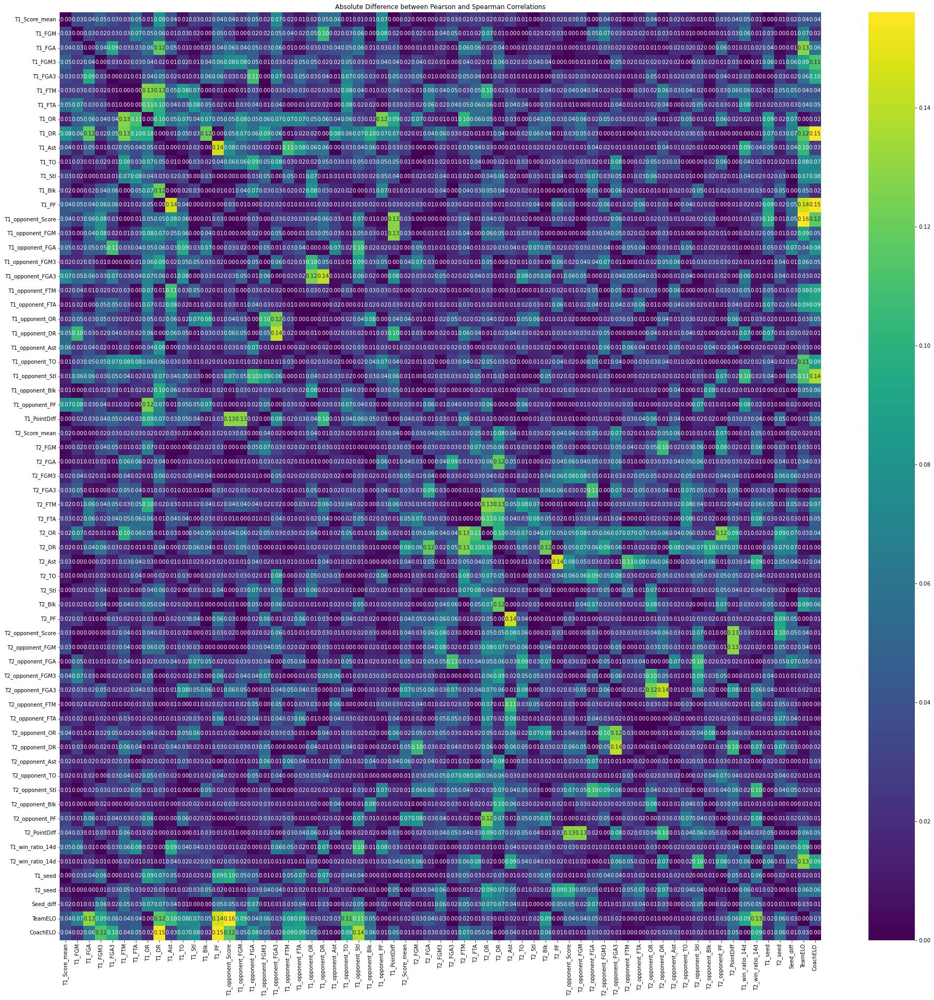

In [13]:
plt.figure(figsize=(32,32))
sns.heatmap(diff_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title("Absolute Difference between Pearson and Spearman Correlations")
plt.show()

In [64]:
significant_cols = diff_matrix.columns[(diff_matrix >= 0.14).any()]
diff_matrix_significant = diff_matrix.loc[significant_cols, significant_cols]
diff_matrix_significant

,T1_DR,T1_Ast,T1_PF,T1_opponent_Score,T1_opponent_FGA3,T1_opponent_DR,T2_Ast,T2_PF,T2_opponent_FGA3,T2_opponent_DR,TeamELO,CoachELO
T1_DR,2.220446e-16,1.458740e-02,0.001701,5.217717e-02,0.055463,4.300877e-03,4.102233e-03,0.005857,7.969330e-03,0.022543,0.116989,0.154921
T1_Ast,1.458740e-02,4.440892e-16,0.144802,7.781158e-02,0.007508,6.119039e-02,1.358580e-02,0.019856,1.315123e-02,0.041534,0.103937,0.028696
T1_PF,1.701317e-03,1.448024e-01,0.000000,3.269240e-02,0.021810,2.967916e-02,1.985585e-02,0.059891,9.769958e-03,0.029078,0.144979,0.153964
T1_opponent_Score,5.217717e-02,7.781158e-02,0.032692,2.220446e-16,0.026950,5.739986e-02,1.427912e-02,0.033159,5.805532e-02,0.025815,0.156054,0.116368
T1_opponent_FGA3,5.546255e-02,7.507879e-03,0.021810,2.694990e-02,0.000000,1.406871e-01,1.315123e-02,0.009770,4.060183e-02,0.000249,0.029080,0.020933
T1_opponent_DR,4.300877e-03,6.119039e-02,0.029679,5.739986e-02,0.140687,2.220446e-16,4.153369e-02,0.029078,2.490838e-04,0.011341,0.024838,0.008940
T2_Ast,4.102233e-03,1.358580e-02,0.019856,1.427912e-02,0.013151,4.153369e-02,3.330669e-16,0.144802,7.507879e-03,0.061190,0.016499,0.035413
T2_PF,5.856565e-03,1.985585e-02,0.059891,3.315936e-02,0.009770,2.907811e-02,1.448024e-01,0.000000,2.181016e-02,0.029679,0.002952,0.014893
T2_opponent_FGA3,7.969330e-03,1.315123e-02,0.009770,5.805532e-02,0.040602,2.490838e-04,7.507879e-03,0.021810,1.110223e-16,0.140687,0.019751,0.011007
T2_opponent_DR,2.254296e-02,4.153369e-02,0.029078,2.581486e-02,0.000249,1.134055e-02,6.119039e-02,0.029679,1.406871e-01,0.000000,0.004948,0.022426


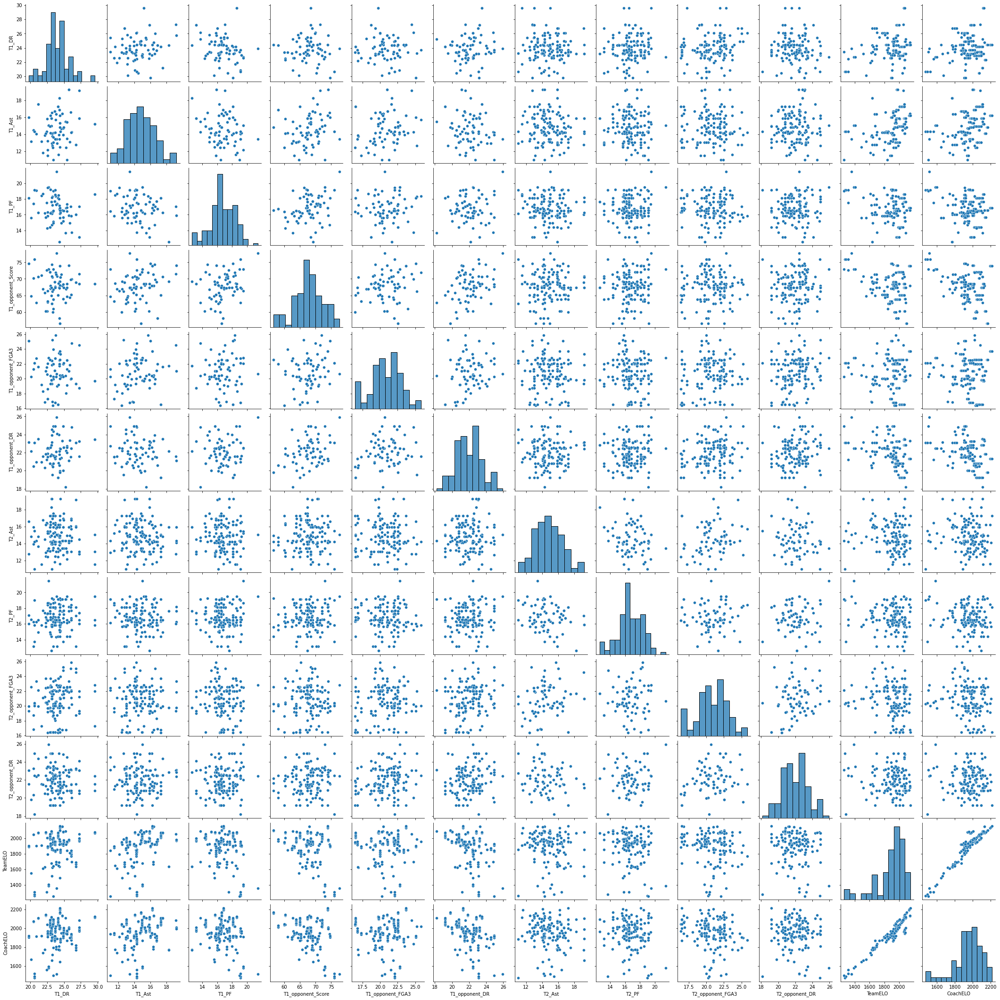

In [65]:
sns.pairplot(df_test_men_list.iloc[:, 7:][list(diff_matrix_significant)])
plt.show()

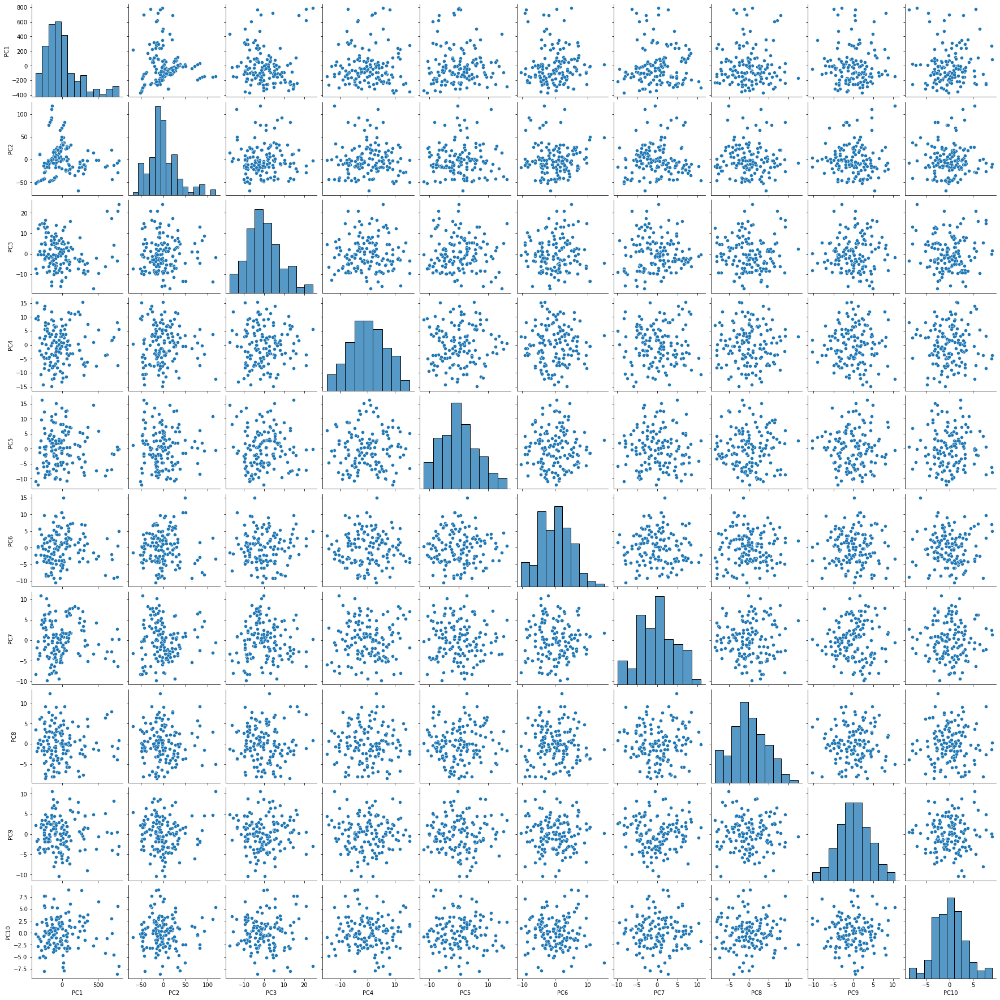

In [25]:
pca = PCA(n_components=10)
df_pca = pd.DataFrame(pca.fit_transform(df_test_men_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(10)])
sns.pairplot(df_pca)
plt.show()

In [50]:
print('No PCA')
pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(x_train_men, y_train_men)
y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
score = brier_score_loss(y_test_men, y_prob_men)
print(score)

component_number = 10
print('PCA, ', component_number, ' components')
pca = PCA(n_components=component_number)
df_pca_train = pd.DataFrame(pca.fit_transform(df_train_men_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])
pca = PCA(n_components=component_number)
df_pca_test = pd.DataFrame(pca.fit_transform(df_test_men_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(df_pca_train, y_train_men)
y_prob_men = pipeline.predict_proba(df_pca_test)[:, 1]
score = brier_score_loss(y_test_men, y_prob_men)
print(score)

No PCA
0.2030212960396469
PCA,  10  components
0.22034531497414034


### For women

In [66]:
# Example usage:
# Suppose you want to compute the nonlinearity matrix for the columns from index 7 onward:
diff_matrix = nonlinearity_matrix(df_test_women_list.iloc[:, 7:])

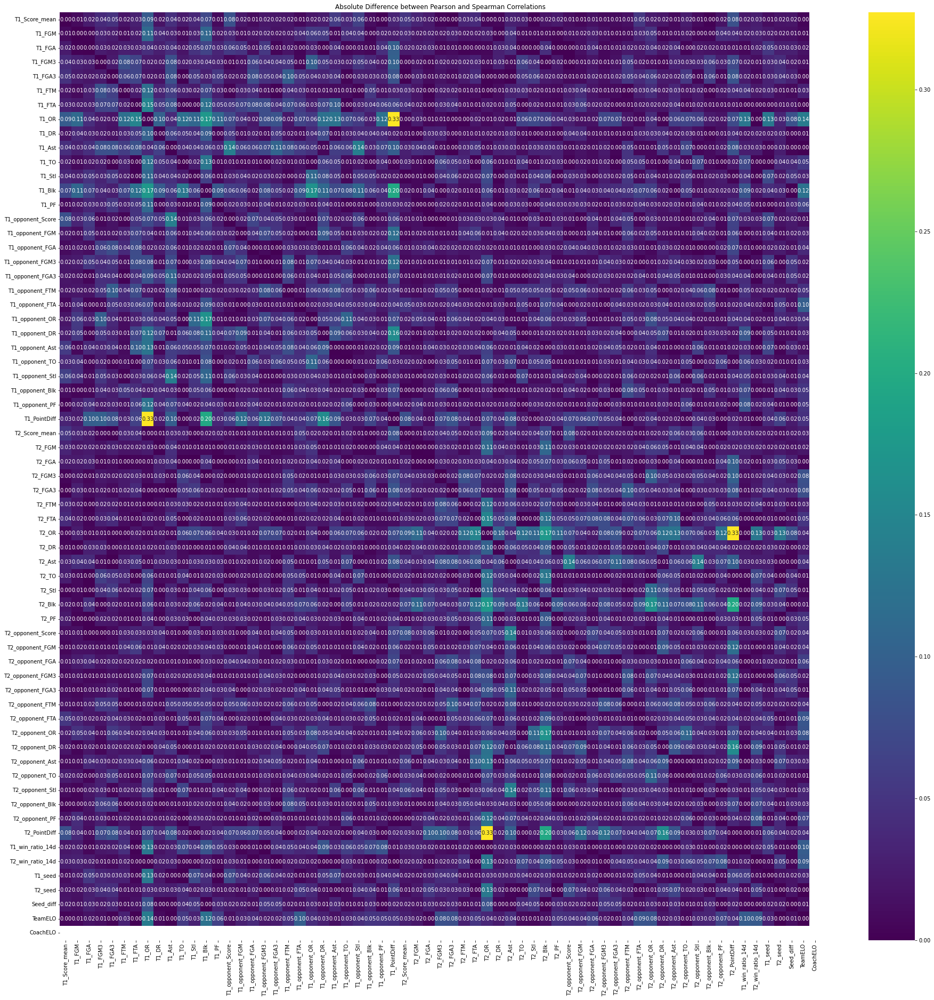

In [67]:
plt.figure(figsize=(32,32))
sns.heatmap(diff_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title("Absolute Difference between Pearson and Spearman Correlations")
plt.show()

In [72]:
significant_cols = diff_matrix.columns[(diff_matrix >= 0.14).any()]
diff_matrix_significant = diff_matrix.loc[significant_cols, significant_cols]
diff_matrix_significant

,T1_FTA,T1_OR,T1_Blk,T1_opponent_OR,T1_opponent_DR,T1_PointDiff,T2_FTA,T2_OR,T2_Blk,T2_opponent_OR,T2_opponent_DR,T2_PointDiff
T1_FTA,0.000000,0.147163,0.122600,2.759615e-02,6.613708e-02,0.063071,5.956746e-03,2.013826e-02,0.008901,0.021975,0.018595,1.272436e-02
T1_OR,0.147163,0.000000,0.174841,5.562137e-02,1.218055e-01,0.327232,2.013826e-02,6.613044e-03,0.062009,0.039671,0.002788,7.385142e-02
T1_Blk,0.122600,0.174841,0.000000,1.656219e-01,1.111044e-01,0.195747,8.900796e-03,6.200939e-02,0.015929,0.062152,0.022057,2.316535e-02
T1_opponent_OR,0.027596,0.055621,0.165622,2.220446e-16,5.401467e-02,0.070475,2.197471e-02,3.967112e-02,0.062152,0.078450,0.045966,4.257781e-02
T1_opponent_DR,0.066137,0.121805,0.111104,5.401467e-02,1.110223e-16,0.156701,1.859518e-02,2.788015e-03,0.022057,0.045966,0.068814,1.514991e-02
T1_PointDiff,0.063071,0.327232,0.195747,7.047494e-02,1.567013e-01,0.000000,1.272436e-02,7.385142e-02,0.023165,0.042578,0.015150,2.469063e-02
T2_FTA,0.005957,0.020138,0.008901,2.197471e-02,1.859518e-02,0.012724,3.330669e-16,1.471634e-01,0.122600,0.027596,0.066137,6.307054e-02
T2_OR,0.020138,0.006613,0.062009,3.967112e-02,2.788015e-03,0.073851,1.471634e-01,2.220446e-16,0.174841,0.055621,0.121805,3.272320e-01
T2_Blk,0.008901,0.062009,0.015929,6.215163e-02,2.205735e-02,0.023165,1.226000e-01,1.748407e-01,0.000000,0.165622,0.111104,1.957472e-01
T2_opponent_OR,0.021975,0.039671,0.062152,7.844994e-02,4.596637e-02,0.042578,2.759615e-02,5.562137e-02,0.165622,0.000000,0.054015,7.047494e-02


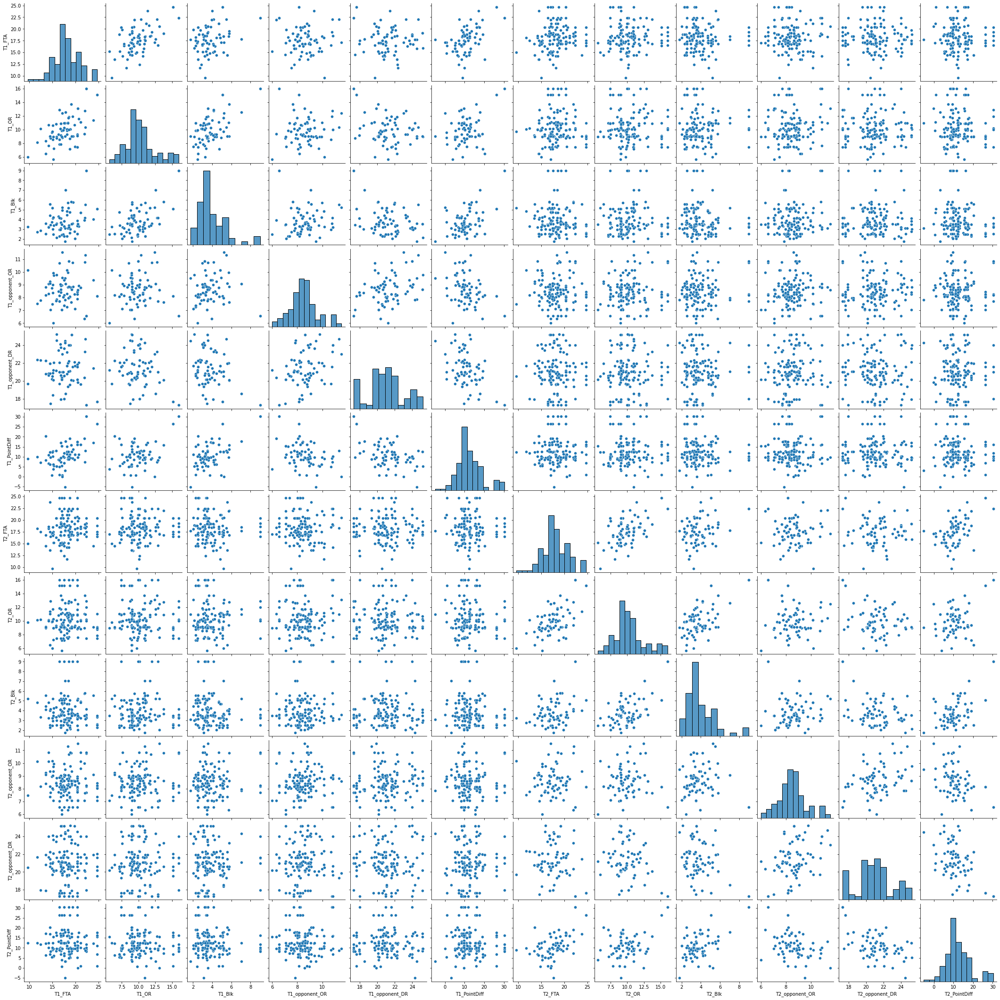

In [73]:
sns.pairplot(df_test_women_list.iloc[:, 7:][list(diff_matrix_significant)])
plt.show()

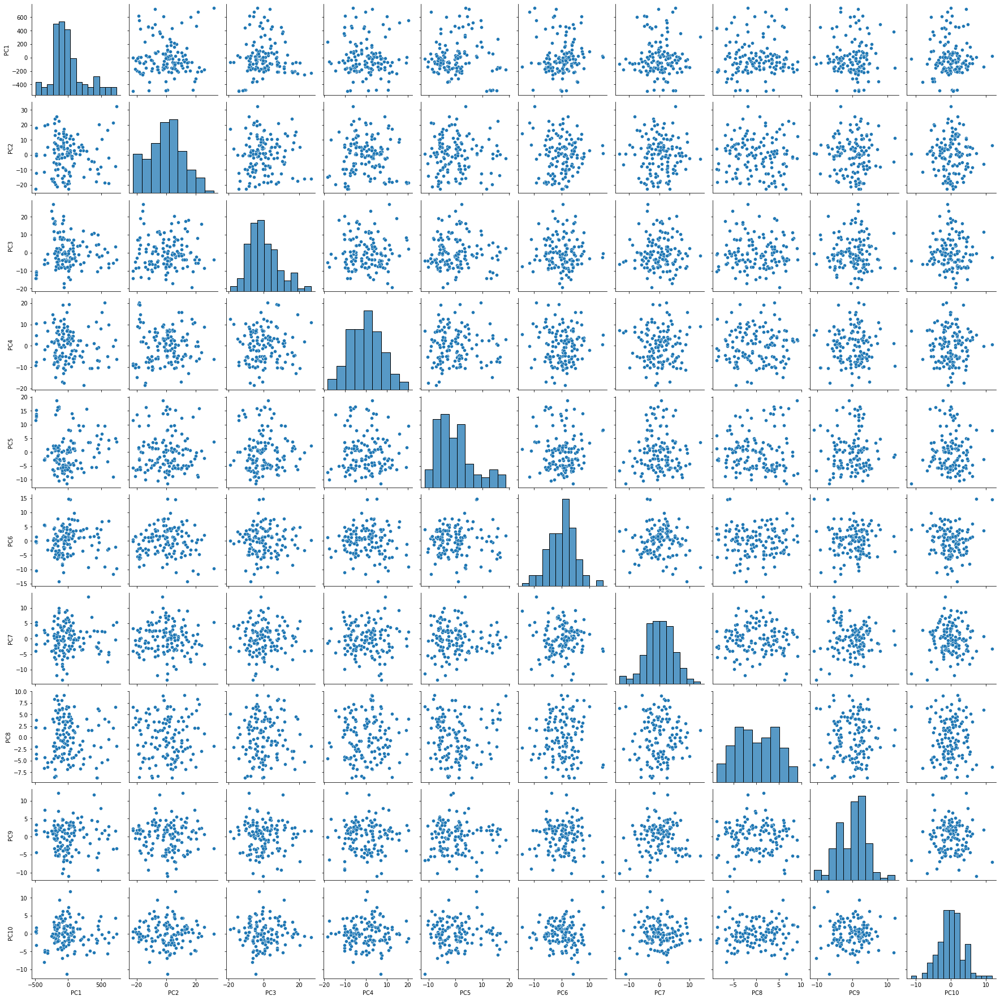

In [74]:
pca = PCA(n_components=10)
df_pca = pd.DataFrame(pca.fit_transform(df_test_women_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(10)])
sns.pairplot(df_pca)
plt.show()

In [75]:
print('No PCA')
pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(x_train_women, y_train_women)
y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
score = brier_score_loss(y_test_women, y_prob_women)
print(score)

component_number = 10
print('PCA, ', component_number, ' components')
pca = PCA(n_components=component_number)
df_pca_train = pd.DataFrame(pca.fit_transform(df_train_women_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])
pca = PCA(n_components=component_number)
df_pca_test = pd.DataFrame(pca.fit_transform(df_test_women_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(df_pca_train, y_train_women)
y_prob_women = pipeline.predict_proba(df_pca_test)[:, 1]
score = brier_score_loss(y_test_women, y_prob_women)
print(score)

No PCA
0.17566671820008017
PCA,  10  components
0.30664197387263203


### Trying transformations

In [7]:
from sklearn.preprocessing import PowerTransformer
def auto_power_transform(X, y, threshold=0.1):
    """
    Automatically detects non-linear features by comparing Pearson and Spearman correlations
    with the target y. If the absolute difference is above threshold, transforms that feature
    using PowerTransformer (Yeo-Johnson). Returns a new DataFrame with transformed features.

    Parameters:
      X : pd.DataFrame
          DataFrame of numeric features.
      y : array-like
          Target vector (numeric or binary).
      threshold : float (default=0.1)
          Minimum absolute difference between Pearson and Spearman correlations
          to trigger a transformation.

    Returns:
      X_transformed : pd.DataFrame
          DataFrame with selected features transformed.
    """
    # Make a copy so as not to modify original data
    X_transformed = X.copy()

    # Loop over each feature column
    for col in X.columns:
        # Create a temporary DataFrame with feature and target; drop NaNs.
        temp = pd.DataFrame({col: X[col], 'target': y}).dropna()
        if temp.empty:
            continue
        # Compute correlations
        p_corr, _ = pearsonr(temp[col], temp['target'])
        s_corr, _ = spearmanr(temp[col], temp['target'])
        diff = abs(p_corr - s_corr)
        print(f"Column: {col}, Pearson: {p_corr:.3f}, Spearman: {s_corr:.3f}, Diff: {diff:.3f}")
        # If the difference is larger than the threshold, apply PowerTransformer.
        if diff > threshold:
            pt = PowerTransformer(method='yeo-johnson', standardize=True)
            # Reshape the column to 2D for transformation and flatten back
            col_vals = X_transformed[col].values.reshape(-1, 1)
            X_transformed[col] = pt.fit_transform(col_vals).flatten()
            print(f"Transformed column {col}")
    return X_transformed


In [76]:

# Example usage:
# Suppose X is your DataFrame of features and y is your target vector.
X_transformed = auto_power_transform(df_test_women_list, y_test_women, threshold=0.14)

Column: Season, Pearson: nan, Spearman: nan, Diff: nan
Column: DayNum, Pearson: -0.000, Spearman: 0.000, Diff: 0.000
Column: T1_TeamID, Pearson: 0.065, Spearman: 0.060, Diff: 0.006
Column: T1_Score, Pearson: 0.577, Spearman: 0.582, Diff: 0.005
Column: T2_TeamID, Pearson: -0.065, Spearman: -0.060, Diff: 0.006
Column: T2_Score, Pearson: -0.577, Spearman: -0.582, Diff: 0.005
Column: location, Pearson: 0.545, Spearman: 0.545, Diff: 0.000
Column: T1_Score_mean, Pearson: 0.344, Spearman: 0.321, Diff: 0.023
Column: T1_FGM, Pearson: 0.374, Spearman: 0.361, Diff: 0.013
Column: T1_FGA, Pearson: 0.290, Spearman: 0.275, Diff: 0.015
Column: T1_FGM3, Pearson: -0.039, Spearman: -0.055, Diff: 0.016
Column: T1_FGA3, Pearson: -0.095, Spearman: -0.102, Diff: 0.006
Column: T1_FTM, Pearson: 0.285, Spearman: 0.261, Diff: 0.024
Column: T1_FTA, Pearson: 0.279, Spearman: 0.249, Diff: 0.030
Column: T1_OR, Pearson: 0.214, Spearman: 0.175, Diff: 0.039
Column: T1_DR, Pearson: 0.194, Spearman: 0.193, Diff: 0.001
Co

In [78]:
diff_matrix = nonlinearity_matrix(X_transformed.iloc[:, 7:])

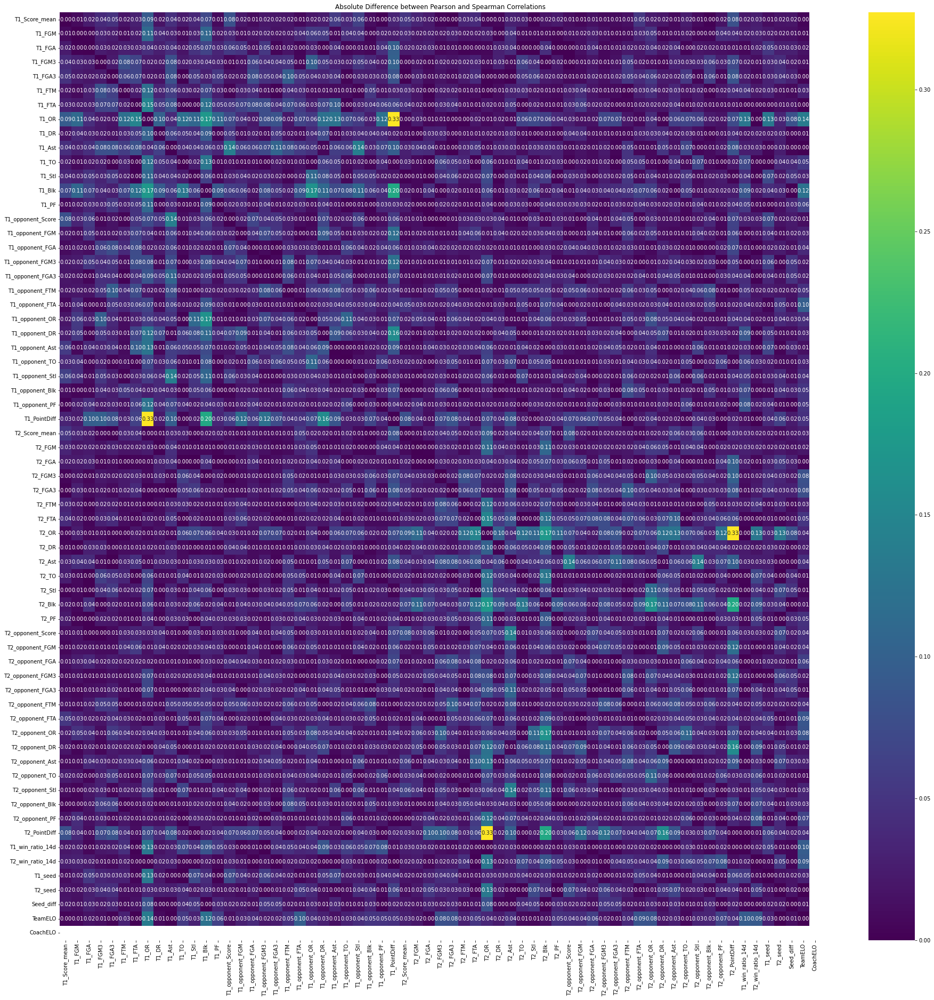

In [79]:
plt.figure(figsize=(32,32))
sns.heatmap(diff_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title("Absolute Difference between Pearson and Spearman Correlations")
plt.show()

In [81]:
X_train_transformed = auto_power_transform(df_train_women_list, y_train_women, threshold=0.14)

Column: Season, Pearson: -0.000, Spearman: 0.000, Diff: 0.000
Column: DayNum, Pearson: 0.000, Spearman: 0.000, Diff: 0.000
Column: T1_TeamID, Pearson: -0.008, Spearman: -0.010, Diff: 0.003
Column: T1_Score, Pearson: 0.589, Spearman: 0.608, Diff: 0.019
Column: T2_TeamID, Pearson: 0.008, Spearman: 0.010, Diff: 0.003
Column: T2_Score, Pearson: -0.589, Spearman: -0.608, Diff: 0.019
Column: location, Pearson: 0.417, Spearman: 0.417, Diff: 0.000
Column: T1_Score_mean, Pearson: 0.303, Spearman: 0.302, Diff: 0.001
Column: T1_FGM, Pearson: 0.337, Spearman: 0.338, Diff: 0.000
Column: T1_FGA, Pearson: 0.179, Spearman: 0.184, Diff: 0.005
Column: T1_FGM3, Pearson: -0.051, Spearman: -0.053, Diff: 0.003
Column: T1_FGA3, Pearson: -0.112, Spearman: -0.113, Diff: 0.001
Column: T1_FTM, Pearson: 0.088, Spearman: 0.089, Diff: 0.001
Column: T1_FTA, Pearson: 0.065, Spearman: 0.071, Diff: 0.006
Column: T1_OR, Pearson: 0.106, Spearman: 0.106, Diff: 0.001
Column: T1_DR, Pearson: 0.181, Spearman: 0.182, Diff: 0.

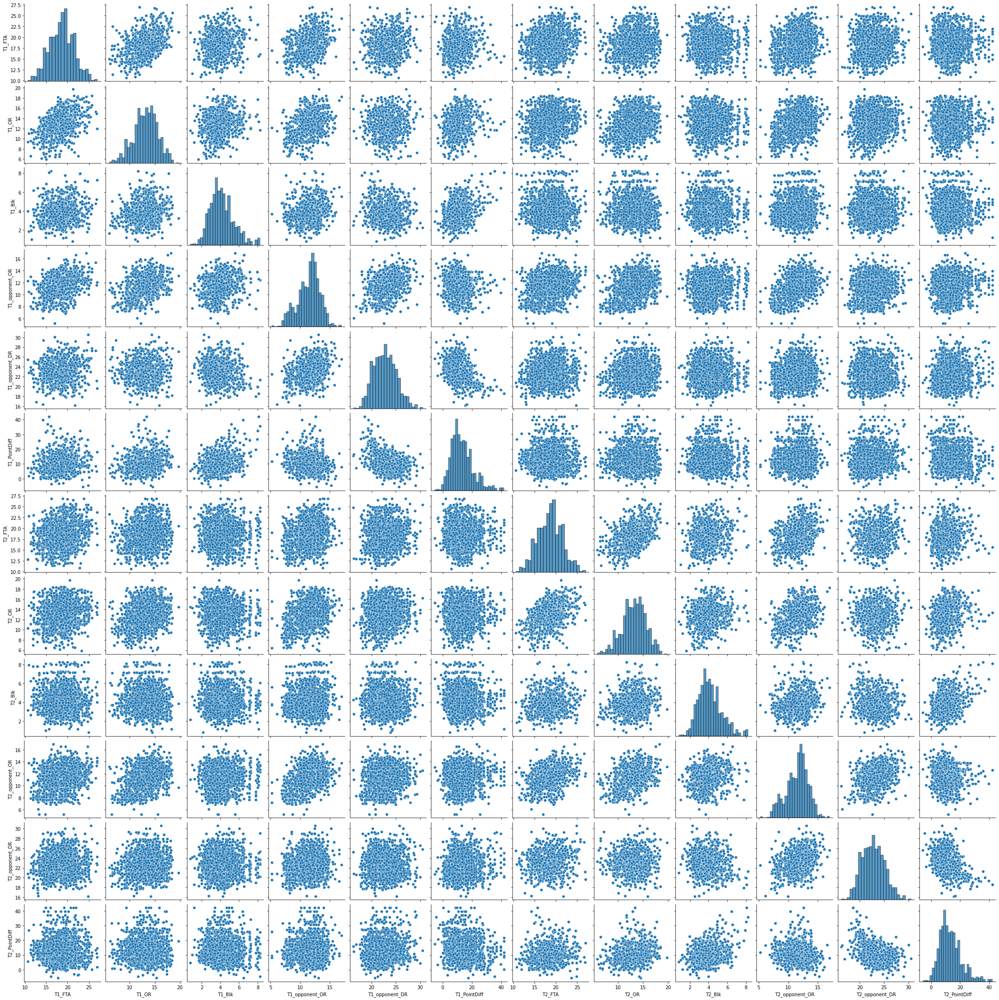

In [90]:
sns.pairplot(X_train_transformed.iloc[:, 7:][list(diff_matrix_significant)])
plt.show()

In [84]:
print('No PCA')
pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(X_train_transformed, y_train_women)
y_prob_women = pipeline.predict_proba(X_transformed)[:, 1]
score = brier_score_loss(y_test_women, y_prob_women)
print(score)

No PCA
0.010975223214579902


In [89]:
y_prob_women

array([1.00000000e+00, 9.99999989e-01, 9.93494017e-01, 9.99999720e-01,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 4.45887885e-01, 9.96703020e-01, 1.00000000e+00,
       9.92136241e-01, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       9.98740211e-01, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       9.99999996e-01, 1.00000000e+00, 9.99752659e-01, 9.98197976e-01,
       4.98776363e-01, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 9.99995080e-01, 1.00000000e+00, 1.00000000e+00,
       9.99970094e-01, 1.00000000e+00, 1.00000000e+00, 9.99998790e-01,
       9.99931411e-01, 1.00000000e+00, 9.99999830e-01, 1.00000000e+00,
       9.99948445e-01, 1.00000000e+00, 1.00000000e+00, 9.91800257e-01,
       9.97170473e-01, 1.00000000e+00, 9.99999992e-01, 1.00000000e+00,
       9.99999911e-01, 9.99998975e-01, 9.92628357e-01, 9.99835969e-01,
      

In [88]:
y_test_women

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [87]:
X_transformed

,Season,DayNum,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_Score_mean,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_FTM,T1_FTA,T1_OR,T1_DR,T1_Ast,T1_TO,T1_Stl,T1_Blk,T1_PF,T1_opponent_Score,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_FTM,T1_opponent_FTA,T1_opponent_OR,T1_opponent_DR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_Blk,T1_opponent_PF,T1_PointDiff,T2_Score_mean,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_FTM,T2_FTA,T2_OR,T2_DR,T2_Ast,T2_TO,T2_Stl,T2_Blk,T2_PF,T2_opponent_Score,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_FTM,T2_opponent_FTA,T2_opponent_OR,T2_opponent_DR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_Blk,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,TeamELO,CoachELO
0,2023,135,3280,70,3228,56,0,71.533333,26.833333,59.600000,5.833333,16.466667,12.033333,18.166667,10.100000,26.366667,15.866667,15.600000,9.133333,4.833333,15.733333,59.100000,21.533333,60.033333,6.000000,22.000000,10.033333,15.300000,10.133333,21.666667,12.366667,16.400000,7.566667,3.433333,17.966667,12.433333,75.935484,28.967742,62.967742,7.258065,19.225806,10.741935,14.193548,10.677419,24.193548,14.322581,12.516129,6.096774,3.258065,16.612903,65.064516,23.580645,58.677419,4.935484,17.967742,12.967742,17.935484,8.290323,20.838710,11.967742,13.387097,6.322581,2.838710,15.451613,10.870968,0.000000,0.500000,11,11,0,1904.755175,1612.000528
1,2023,135,3357,57,3380,47,0,62.300000,22.766667,59.866667,5.233333,19.366667,11.533333,17.733333,10.933333,22.233333,10.300000,15.233333,9.633333,3.100000,18.600000,59.133333,20.933333,53.833333,5.800000,18.366667,11.466667,17.366667,7.833333,24.300000,12.133333,18.100000,6.400000,3.033333,17.633333,3.166667,56.333333,20.766667,56.033333,4.866667,14.566667,9.933333,17.700000,9.033333,19.900000,9.933333,13.466667,8.300000,1.766667,20.900000,61.433333,20.966667,50.500000,5.000000,17.200000,14.500000,23.100000,9.500000,24.500000,11.900000,17.366667,6.033333,3.900000,16.766667,-5.100000,1.000000,0.833333,16,16,0,1267.963868,1612.000528
2,2023,136,3385,66,3345,64,0,65.466667,23.833333,54.433333,6.166667,17.333333,11.633333,15.233333,8.966667,22.266667,12.866667,12.900000,5.233333,4.233333,12.433333,59.366667,22.966667,57.933333,4.900000,17.000000,8.533333,12.266667,9.933333,20.100000,11.566667,12.000000,7.033333,3.266667,16.033333,6.100000,70.689655,25.896552,57.724138,7.137931,21.896552,11.758621,15.241379,7.206897,24.482759,15.931034,14.620690,7.793103,3.379310,16.275862,65.172414,23.413793,59.896552,6.965517,22.379310,11.379310,16.275862,9.724138,22.068966,12.965517,15.172414,7.103448,2.827586,16.793103,5.517241,0.500000,0.500000,11,11,0,1803.623948,1612.000528
3,2023,136,3399,79,3284,69,0,68.551724,24.689655,57.517241,6.206897,19.206897,12.965517,17.068966,9.827586,20.620690,15.310345,12.724138,7.896552,2.448276,17.931034,63.137931,22.482759,54.241379,3.827586,14.896552,14.344828,19.517241,8.965517,20.379310,12.137931,15.344828,6.379310,2.551724,18.689655,5.413793,63.656250,22.750000,55.281250,7.687500,23.187500,10.468750,14.843750,9.593750,23.468750,13.250000,16.687500,6.062500,3.750000,14.562500,62.937500,24.281250,59.156250,4.750000,14.843750,9.625000,14.125000,8.750000,20.218750,11.031250,12.500000,8.093750,2.875000,15.875000,0.718750,1.000000,0.833333,16,16,0,1532.928726,1612.000528
4,2023,137,3112,75,3452,62,0,74.366667,27.900000,63.866667,5.633333,16.566667,12.933333,18.866667,10.066667,22.233333,14.633333,12.133333,10.766667,3.000000,18.800000,64.800000,23.433333,56.866667,5.366667,17.633333,12.566667,18.000000,8.833333,24.000000,13.666667,17.633333,5.933333,3.666667,16.800000,9.566667,66.100000,24.133333,61.533333,6.566667,23.166667,11.266667,15.900000,8.933333,22.200000,11.166667,13.066667,9.633333,2.133333,16.866667,61.000000,22.500000,56.733333,5.500000,20.033333,10.500000,15.433333,9.766667,25.233333,11.333333,18.900000,6.566667,3.533333,17.366667,5.100000,0.000000,0.666667,7,1

In [86]:
y_train_women

array([1., 1., 1., ..., 0., 0., 0.])

In [85]:
X_train_transformed

,Season,DayNum,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_Score_mean,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_FTM,T1_FTA,T1_OR,T1_DR,T1_Ast,T1_TO,T1_Stl,T1_Blk,T1_PF,T1_opponent_Score,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_FTM,T1_opponent_FTA,T1_opponent_OR,T1_opponent_DR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_Blk,T1_opponent_PF,T1_PointDiff,T2_Score_mean,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_FTM,T2_FTA,T2_OR,T2_DR,T2_Ast,T2_TO,T2_Stl,T2_Blk,T2_PF,T2_opponent_Score,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_FTM,T2_opponent_FTA,T2_opponent_OR,T2_opponent_DR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_Blk,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,TeamELO,CoachELO
0,2010,138,3124,69,3201,55,0,72.093750,26.093750,56.343750,2.468750,8.656250,17.437500,24.000000,12.187500,31.062500,14.687500,16.875000,6.968750,7.250000,14.125000,56.843750,21.125000,62.625000,5.531250,19.937500,9.062500,13.187500,12.687500,21.781250,9.500000,15.718750,6.656250,1.875000,19.250000,15.250000,73.454545,25.848485,61.575758,8.818182,24.848485,12.939394,18.242424,13.878788,24.575758,14.636364,15.636364,10.393939,2.606061,16.393939,60.575758,22.939394,56.696970,4.151515,13.848485,10.545455,16.303030,12.242424,24.818182,11.848485,19.878788,6.757576,2.606061,16.242424,12.878788,0.5,0.750000,4,13,-9,2047.364734,1612.000528
1,2010,138,3173,67,3395,66,0,70.769231,25.884615,61.538462,5.461538,17.461538,13.538462,19.346154,14.730769,28.076923,14.461538,16.961538,7.730769,4.076923,16.576923,59.500000,21.576923,58.692308,5.423077,16.846154,10.923077,16.576923,12.076923,23.769231,11.653846,18.346154,7.615385,4.384615,18.230769,11.269231,72.300000,25.833333,62.266667,6.866667,19.200000,13.766667,18.400000,13.500000,25.833333,15.600000,16.033333,9.833333,3.600000,16.233333,60.300000,21.833333,59.700000,5.733333,20.166667,10.900000,16.300000,14.866667,25.333333,13.466667,20.666667,8.466667,3.500000,16.566667,12.000000,0.5,0.333333,8,9,-1,1803.100984,1612.000528
2,2010,138,3181,72,3214,37,1,71.593750,26.843750,63.750000,4.562500,14.468750,13.343750,20.156250,17.718750,25.593750,14.250000,17.906250,13.375000,5.281250,17.687500,55.062500,18.843750,53.593750,5.312500,16.593750,12.062500,18.125000,12.500000,21.968750,11.375000,23.218750,7.531250,3.281250,17.875000,16.531250,62.833333,22.200000,60.100000,4.900000,16.100000,13.533333,18.933333,14.966667,22.666667,11.600000,15.533333,10.100000,2.233333,18.833333,55.133333,19.000000,49.933333,2.866667,10.333333,14.266667,22.000000,12.633333,26.133333,8.733333,22.133333,6.633333,2.266667,16.700000,7.700000,1.0,1.000000,2,15,-13,2222.732883,1612.000528
3,2010,138,3199,75,3256,61,1,74.466667,26.400000,59.200000,6.100000,16.100000,15.566667,21.800000,14.400000,27.266667,15.333333,19.033333,8.833333,4.033333,17.133333,60.100000,21.333333,59.566667,5.300000,18.433333,12.133333,17.466667,13.400000,21.166667,12.233333,19.200000,8.200000,2.133333,18.933333,14.366667,74.258065,27.161290,62.516129,3.935484,12.451613,16.000000,23.354839,14.806452,29.741935,14.516129,17.096774,7.096774,3.741935,16.032258,64.322581,23.903226,64.064516,4.806452,17.387097,11.709677,18.000000,13.709677,24.451613,10.741935,17.451613,8.193548,4.225806,19.677419,9.935484,0.0,0.800000,3,14,-11,2065.191353,1612.000528
4,2010,138,3207,62,3265,42,0,68.033333,23.833333,60.266667,6.333333,20.066667,14.033333,19.533333,15.766667,19.466667,15.866667,16.300000,13.366667,2.600000,18.033333,58.366667,19.733333,48.866667,5.400000,18.833333,13.500000,18.766667,12.100000,22.900000,13.266667,24.600000,7.933333,3.233333,16.966667,9.666667,68.181818,23.424242,55.696970,6.545455,19.030303,14.787879,18.484848,10.515152,26.303030,14.454545,13.484848,7.878788,4.484848,13.969697,57.909091,20.575758,58.939394,6.333333,21.363636,10.424242,14.909091,14.333333,23.363636,10.727273,15.727273,7.151515,2.303030,16.818182,10.272727,0.5,1.000000,5,12,

### Trying transformations

In [73]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]

year_range = [2023]
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.9, 1.1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
# -------------------------------------------
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
for i in range(len(year_range)):

    if len(year_range) > 1:
        df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
        df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
        df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
        df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

        x_train_women_list.append(x_train_women)
        x_test_women_list.append(x_test_women)
        x_train_men_list.append(x_train_men)
        x_test_men_list.append(x_test_men)

        y_train_women_list.append(y_train_women)
        y_test_women_list.append(y_test_women)
        y_train_men_list.append(y_train_men)
        y_test_men_list.append(y_test_men)

    else:
        df_train_women_list = df_train_women_list[0][columns_to_include_women]
        df_test_women_list = df_test_women_list[0][columns_to_include_women]
        df_train_men_list = df_train_men_list[0][columns_to_include_men]
        df_test_men_list = df_test_men_list[0][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list)
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list)
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list)
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list)

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

In [74]:
for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()

Predictions for season  2023
LogisticRegressionCV for women trained on women 0.16390297219871175
LogisticRegressionCV for men trained on men 0.20783167124187524
LogisticRegressionCV for all trained on women and men separately 0.18650396953251322 <---



In [75]:
def apply_transformation(df, y, threshold=0.014):
    df_transformed = df.copy()
    unchanged = df_transformed.iloc[:, :7]  # Keep first 7 columns unchanged
    to_transform = df_transformed.iloc[:, 7:]  # Columns to transform
    transformed = auto_power_transform(to_transform, y, threshold=threshold)  # Apply transformation
    return pd.concat([unchanged, transformed], axis=1)

# Apply transformations
threshold = 0.05
df_test_men_list_transformed = apply_transformation(df_test_men_list, y_test_men, threshold)
df_train_women_list_transformed = apply_transformation(df_train_women_list, y_train_women, threshold)
df_test_women_list_transformed = apply_transformation(df_test_women_list, y_test_women, threshold)
df_train_men_list_transformed = apply_transformation(df_train_men_list, y_train_men, threshold)

Column: T1_FGM, Pearson: 0.164, Spearman: 0.167, Diff: 0.003
Column: T1_FGA, Pearson: 0.207, Spearman: 0.192, Diff: 0.016
Column: T1_FGM3, Pearson: 0.094, Spearman: 0.081, Diff: 0.012
Column: T1_FGA3, Pearson: 0.096, Spearman: 0.109, Diff: 0.013
Column: T1_OR, Pearson: 0.166, Spearman: 0.128, Diff: 0.038
Column: T1_Ast, Pearson: 0.174, Spearman: 0.204, Diff: 0.030
Column: T1_TO, Pearson: 0.021, Spearman: 0.012, Diff: 0.009
Column: T1_Stl, Pearson: 0.033, Spearman: 0.038, Diff: 0.006
Column: T1_PF, Pearson: 0.008, Spearman: 0.018, Diff: 0.010
Column: T1_opponent_FGM, Pearson: -0.066, Spearman: -0.067, Diff: 0.001
Column: T1_opponent_FGA, Pearson: -0.002, Spearman: -0.028, Diff: 0.026
Column: T1_opponent_FGM3, Pearson: -0.148, Spearman: -0.134, Diff: 0.014
Column: T1_opponent_FGA3, Pearson: -0.075, Spearman: -0.032, Diff: 0.042
Column: T1_opponent_OR, Pearson: -0.035, Spearman: -0.053, Diff: 0.018
Column: T1_opponent_Ast, Pearson: -0.125, Spearman: -0.133, Diff: 0.008
Column: T1_opponent

Column: T1_opponent_PF, Pearson: -0.019, Spearman: -0.019, Diff: 0.000
Column: T1_PointDiff, Pearson: 0.289, Spearman: 0.292, Diff: 0.002
Column: T2_FGM, Pearson: -0.178, Spearman: -0.169, Diff: 0.009
Column: T2_FGA, Pearson: -0.113, Spearman: -0.107, Diff: 0.006
Column: T2_FGM3, Pearson: -0.030, Spearman: -0.028, Diff: 0.003
Column: T2_FGA3, Pearson: -0.004, Spearman: -0.001, Diff: 0.003
Column: T2_OR, Pearson: -0.095, Spearman: -0.088, Diff: 0.007
Column: T2_Ast, Pearson: -0.138, Spearman: -0.131, Diff: 0.007
Column: T2_TO, Pearson: 0.100, Spearman: 0.092, Diff: 0.008
Column: T2_Stl, Pearson: -0.071, Spearman: -0.068, Diff: 0.003
Column: T2_PF, Pearson: 0.113, Spearman: 0.111, Diff: 0.002
Column: T2_opponent_FGM, Pearson: 0.062, Spearman: 0.057, Diff: 0.005
Column: T2_opponent_FGA, Pearson: -0.040, Spearman: -0.029, Diff: 0.010
Column: T2_opponent_FGM3, Pearson: 0.037, Spearman: 0.033, Diff: 0.004
Column: T2_opponent_FGA3, Pearson: 0.004, Spearman: -0.003, Diff: 0.008
Column: T2_oppo

In [76]:
x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list_transformed)
x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list_transformed)
x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list_transformed)
x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list_transformed)

In [77]:
for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()

Predictions for season  2023
LogisticRegressionCV for women trained on women 0.16390297219871297
LogisticRegressionCV for men trained on men 0.21028636124664912
LogisticRegressionCV for all trained on women and men separately 0.18776688975236128 <---



# Final data frame

In [3]:
def prepare_data(df):

    """
    This function duplicates and flips a game record.
    Now two records with the same data are present,
    but viewed from perspectives of two different teams.
    """

    df = df[[
         'Season', 'DayNum', 'NumOT',
         'WTeamID',  'WScore', 'WLoc',
         'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR', 'WAst', 'WTO', 'WStl', 'WBlk', 'WPF',
         'LTeamID', 'LScore',
         'LFGM', 'LFGA', 'LFGM3', 'LFGA3', 'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF'
    ]]
    dfswap = df[[
         'Season', 'DayNum', 'NumOT',
         'LTeamID', 'LScore', 'WLoc',
         'LFGM', 'LFGA', 'LFGM3', 'LFGA3', 'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF',
         'WTeamID',  'WScore',
         'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR', 'WAst', 'WTO', 'WStl', 'WBlk', 'WPF',
    ]].copy()

    dfswap.loc[df['WLoc'] == 'H', 'WLoc'] = 'A'
    dfswap.loc[df['WLoc'] == 'A', 'WLoc'] = 'H'

    df = df.rename(columns={'WLoc': 'location'})
    dfswap = dfswap.rename(columns={'WLoc': 'location'})

    df.columns = [x.replace('W','T1_').replace('L','T2_') for x in list(df.columns)]
    dfswap.columns = [x.replace('L','T1_').replace('W','T2_') for x in list(dfswap.columns)]

    output = pd.concat([df, dfswap]).reset_index(drop=True)
    output.loc[output.location=='N','location'] = '0'
    output.loc[output.location=='H','location'] = '1'
    output.loc[output.location=='A','location'] = '-1'
    output.location = output.location.astype(int)

    output['PointDiff'] = output['T1_Score'] - output['T2_Score']

    return output

def get_data(regular_results, tourney_results, seeds, prepared=False, location_multiplier=[1, 1], win_ratio_days_back=14):

    """
    This function uses the prepare_data function in order to create
    a data frame with season statistics for each team.
    These statistics are added to records with games played in
    tournament to make data 'x' used in model to predict the game
    result 'y'. The output is a data frame that contains data 'x'
    and also label 'y' can be easily calculated based on score difference in matches.
    """

    if prepared:
        regular_data = regular_results.copy()
        tourney_data = tourney_results.copy()
    else:
        # make data frames with extra rows to represent the perspective of losing team
        regular_data = prepare_data(regular_results)
        tourney_data = prepare_data(tourney_results)

    # ----------------------------------- Add reward/penalty for playing in home or away
    if location_multiplier[0] == 1 and location_multiplier[1] == 1:
        # data frame with mean game statistics for a given team in a given season
        season_statistics  = regular_data.groupby(["Season", 'T1_TeamID'])[
            [
                'T1_Score', 'T1_FGM','T1_FGA','T1_FGM3','T1_FGA3','T1_FTM','T1_FTA',
                'T1_OR','T1_DR','T1_Ast','T1_TO','T1_Stl','T1_Blk','T1_PF',
                'T2_Score', 'T2_FGM','T2_FGA','T2_FGM3','T2_FGA3','T2_FTM','T2_FTA',
                'T2_OR','T2_DR','T2_Ast','T2_TO','T2_Stl','T2_Blk','T2_PF',
                'PointDiff'
            ]
        ].agg('mean').reset_index()
    else:
        # Define which columns to adjust (you can add or remove columns as needed)
        T1_cols = ['T1_Score','T1_FGM','T1_FGA','T1_FGM3','T1_FGA3','T1_FTM','T1_FTA','T1_OR','T1_DR','T1_Ast','T1_TO','T1_Stl','T1_Blk','T1_PF']
        T2_cols = ['T2_Score','T2_FGM','T2_FGA','T2_FGM3','T2_FGA3','T2_FTM','T2_FTA','T2_OR','T2_DR','T2_Ast','T2_TO','T2_Stl','T2_Blk','T2_PF']

        # Convert the relevant columns to float before applying the adjustment function.
        cols_to_float = T1_cols + T2_cols
        regular_data[cols_to_float] = regular_data[cols_to_float].astype(float)

        def adjust_stats(row):
            # Determine multipliers based on location
            if row['location'] == 1:
                factor_T1 = location_multiplier[0]  # penalize Team1 stats (home)
                factor_T2 = location_multiplier[1]  # boost Team2 stats
            elif row['location'] == -1:
                factor_T1 = location_multiplier[1]  # boost Team1 stats (away)
                factor_T2 = location_multiplier[0]  # penalize Team2 stats
            else:
                factor_T1 = 1.0
                factor_T2 = 1.0

            # Adjust Team1 stats
            for col in T1_cols:
                if col in row and pd.notnull(row[col]):
                    row[col] = row[col] * factor_T1

            # Adjust Team2 stats
            for col in T2_cols:
                if col in row and pd.notnull(row[col]):
                    row[col] = row[col] * factor_T2

            # Recalculate derived statistics (if needed)
            if 'T1_Score' in row and 'T2_Score' in row:
                row['PointDiff'] = row['T1_Score'] - row['T2_Score']
            return row

        # Apply the adjustment function row-wise.
        regular_data_adjusted = regular_data.apply(adjust_stats, axis=1)

        # Now group by Season and T1_TeamID to compute season averages for the adjusted statistics.
        stats_columns = T1_cols[1:] + T2_cols[1:] + ['PointDiff']  # Exclude T1_TeamID from stats if present.
        season_statistics = regular_data_adjusted.groupby(["Season", 'T1_TeamID'])[stats_columns].agg('mean').reset_index()
    # -----------------------------------

    # mean statistics for team and team's opponent's
    season_statistics_T1 = season_statistics.copy()
    season_statistics_T2 = season_statistics.copy()

    season_statistics_T1.columns = ["T1_" + x.replace("T1_","").replace("T2_","opponent_") for x in list(season_statistics_T1.columns)]
    season_statistics_T2.columns = ["T2_" + x.replace("T1_","").replace("T2_","opponent_") for x in list(season_statistics_T2.columns)]
    season_statistics_T1.columns.values[0] = "Season"
    season_statistics_T2.columns.values[0] = "Season"
    season_statistics_T1 = season_statistics_T1.rename(columns={'T1_Score': 'T1_Score_mean'})
    season_statistics_T2 = season_statistics_T2.rename(columns={'T2_Score': 'T2_Score_mean'})

#     print('season_statistics_T2 in get data')
#     print(season_statistics_T2)

    # data frame containing game's result
#     print('tourney_data BEFORE MERGE')
#     print(tourney_data)
    tourney_data = tourney_data[['Season', 'DayNum', 'T1_TeamID', 'T1_Score', 'T2_TeamID' ,'T2_Score', 'location']]
    tourney_data = pd.merge(tourney_data, season_statistics_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, season_statistics_T2, on = ['Season', 'T2_TeamID'], how = 'left')
#     print('tourney_data AFTER MERGE NO NA')
#     print(tourney_data[tourney_data['T1_FGM'].notna()])

    calculate_win_ratio_days_back = 132 - win_ratio_days_back

    # data frame with win fraction from last x days for a given team in a given season
    last14days_stats_T1 = regular_data.loc[regular_data.DayNum>calculate_win_ratio_days_back].reset_index(drop=True)
    last14days_stats_T1['win'] = np.where(last14days_stats_T1['PointDiff']>0,1,0)
    last14days_stats_T1 = last14days_stats_T1.groupby(['Season','T1_TeamID'])['win'].mean().reset_index(name='T1_win_ratio_14d')

    last14days_stats_T2 = regular_data.loc[regular_data.DayNum>calculate_win_ratio_days_back].reset_index(drop=True)
    last14days_stats_T2['win'] = np.where(last14days_stats_T2['PointDiff']<0,1,0)
    last14days_stats_T2 = last14days_stats_T2.groupby(['Season','T2_TeamID'])['win'].mean().reset_index(name='T2_win_ratio_14d')

    # add to tourney_data column with win fraction for winning and losing team
    tourney_data = pd.merge(tourney_data, last14days_stats_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, last14days_stats_T2, on = ['Season', 'T2_TeamID'], how = 'left')

    # get seeds with no regional division
    seeds['seed'] = seeds['Seed'].apply(lambda x: int(x[1:3]))

    # give each team a raw seed
    seeds_T1 = seeds[['Season','TeamID','seed']].copy()
    seeds_T2 = seeds[['Season','TeamID','seed']].copy()
    seeds_T1.columns = ['Season','T1_TeamID','T1_seed']
    seeds_T2.columns = ['Season','T2_TeamID','T2_seed']

    # add seeds to turney data for team 1 and team 2
    tourney_data = pd.merge(tourney_data, seeds_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, seeds_T2, on = ['Season', 'T2_TeamID'], how = 'left')

    # add a seed difference column
    tourney_data["Seed_diff"] = tourney_data["T1_seed"] - tourney_data["T2_seed"]

    return tourney_data

def get_df(seeds,
            season_games, season_range, days_back,
            tourney_games, tourney_range,
            location_multiplier=[1, 1],
           win_ratio_days_back=14):

    """
    This function uses get_data function to get a data
    frame which is then used to make 'x' and 'y' data
    used in models.
    """

    # Get from regular season games from specified season range and days back
    # The results of those games will be used as team statictics (additional team information for tourney games)
    regular_results = season_games[season_games['Season'].isin(season_range)]
    regular_results = regular_results[regular_results['DayNum'] > 134 - days_back]

    # Get tourney games from a specified season
    # The results of those games will be used as labels
    tourney_results = tourney_games[tourney_games['Season'].isin(tourney_range)]

    # Get final data frame
    df = get_data(regular_results, tourney_results, seeds, location_multiplier=[1, 1], win_ratio_days_back=win_ratio_days_back)

    return df

def get_final_df(seeds,
                   season_games, season_range, days_back,
                   tourney_games, tourney_range,
                   SampleSubmissionStage2,
                  location_multiplier=[1, 1],
                win_ratio_days_back=14):

    """
    This function works the same as function get_x_y,
    but also creates (at the moment it's the same as get_x_y)
    aditional data points mostly with NaN values that matches
    the submission format (parsed team matchups with the sample submission file).
    """

    # Get from regular season games from specified season range and days back
    # The results of those games will be used as team statictics (additional team information for tourney games)
    regular_results = season_games[season_games['Season'].isin(season_range)]
    regular_results = regular_results[regular_results['DayNum'] > 134 - days_back]

    # Get tourney games from a specified season
    # The results of those games will be used as labels
    tourney_results = tourney_games[tourney_games['Season'].isin(tourney_range)]

    # Assume sample_submission is a DataFrame with an "ID" column like "2023_1101_1102"
    # and tourney_results is a DataFrame with columns including: Season, WTeamID, LTeamID, DayNum, WScore, LScore, WLoc, etc.
    # Filter rows where the ID starts with the specified season (followed by an underscore)
    final_season = tourney_range[0]
    sample_submission_copy = SampleSubmissionStage2.copy()
    sample_submission = sample_submission_copy[sample_submission_copy['ID'].str.startswith(f"{final_season}_")]
    sample_submission = sample_submission.drop(columns=['Pred'])

    sample_submission[['Season', 'Team1', 'Team2']] = sample_submission['ID'].str.split('_', expand=True)
    sample_submission['Season'] = sample_submission['Season'].astype(float)
    sample_submission['Team1'] = sample_submission['Team1'].astype(float)
    sample_submission['Team2'] = sample_submission['Team2'].astype(float)

    regular_data_final = prepare_data(regular_results)
    tourney_data_final  = prepare_data(tourney_results)

#     print("-------------")
#     print(regular_data_final)

#     print(list(tourney_data_final))
    sample_submission = sample_submission.rename(columns={'Team1': 'T1_TeamID', 'Team2': 'T2_TeamID'})
#     print('list(sample_submission)')
#     print(list(sample_submission))
    tourney_data_final = pd.merge(
        sample_submission,
        tourney_data_final,
        on=['Season', 'T1_TeamID', 'T2_TeamID'],
#         left_on=['Season', 'Team1', 'Team2'],
#         right_on=['Season', 'T1_TeamID', 'T2_TeamID'],
        how='left'
    )
#     tourney_data_final.rename(columns={'Team1': 'T1_TeamID', 'Team2': 'T2_TeamID'}, inplace=True)
#     print("TESM AIN")
#     print(tourney_data_final['T1_TeamID'])
    tourney_data_final = tourney_data_final[['Season', 'DayNum', 'NumOT', 'T1_TeamID', 'T1_Score', 'location', 'T1_FGM', 'T1_FGA', 'T1_FGM3', 'T1_FGA3', 'T1_FTM', 'T1_FTA', 'T1_OR', 'T1_DR', 'T1_Ast', 'T1_TO', 'T1_Stl', 'T1_Blk', 'T1_PF', 'T2_TeamID', 'T2_Score', 'T2_FGM', 'T2_FGA', 'T2_FGM3', 'T2_FGA3', 'T2_FTM', 'T2_FTA', 'T2_OR', 'T2_DR', 'T2_Ast', 'T2_TO', 'T2_Stl', 'T2_Blk', 'T2_PF', 'PointDiff']]
#     print(tourney_data_final['T1_TeamID'])
#     print("-------------")

    tourney_data =  get_data(regular_data_final, tourney_data_final,
                             seeds, prepared=True,
                          win_ratio_days_back=win_ratio_days_back)
#     print("NOTNA")
#     print(tourney_data_final['T1_TeamID'])
#     print(tourney_data[tourney_data['T1_FGM'].notna()])
    tourney_data = pd.merge(
        sample_submission,
        tourney_data,
        on=['Season', 'T1_TeamID', 'T2_TeamID'],
#         left_on=['Season', 'Team1', 'Team2'],
#         right_on=['Season', 'T1_TeamID', 'T2_TeamID'],
        how='left'
    )
#     tourney_data['T1_TeamID'] = tourney_data['Team1']
#     tourney_data['T2_TeamID'] = tourney_data['Team2']
#     tourney_data = tourney_data.drop(['ID', 'Team1', 'Team2'], axis=1)
    tourney_data = tourney_data.drop(['ID'], axis=1)

    return tourney_data

def correct_predictions_based_on_seed(x, y, maximum_favoured_seed = 4, number_of_added_columns=1):
    """
    Sets the winnning chance to 1 or 0 based on the seed difference.
    """
    for i in range(len(x)):
        if x[i][-1-number_of_added_columns] <= (-16 + maximum_favoured_seed * 2 - 1):
            y[i] = 1
        elif x[i][-1-number_of_added_columns] >= (16 - maximum_favoured_seed * 2 + 1):
            y[i] = 0
    return y

def clear_na_from_x_y(x, y):
    """
    The data frame for final season is in format matching the submission file.
    This function clears NaNs from data.
    """
    # Create masks for training data:
    mask_train = ~np.isnan(x).any(axis=1) & ~np.isnan(y)
    x_clean = x[mask_train]
    y_clean = y[mask_train]
    return x_clean, y_clean

def x_y_from_data_frame(df):
    # Prepare data and labels
    x = df[list(df.columns[7:])].values
    y = np.where(
        df[['T1_Score', 'T2_Score']].isnull().any(axis=1),
        np.nan,
        np.where(df['T1_Score'] - df['T2_Score'] > 0, 1, 0)
    )
    return x, y

def get_all_core_data(
    regular_results, tourney_results, seeds, SampleSubmissionStage2,
    final_season = 2024, # the season we want to predict, so for out submission it will be 2025
    start_season = 2005, # from which ponit should we begin creating data
    season_years_list  = [[i-1, i] for i in range(2005, 2024+1)], # at which seasons to look at when calculating team's stats
    days_back = 15, # how many days back from the start of tourney to calculate team's stats per season
    maximum_favoured_seed = 4, # Set the predicted probability of winning to 1 for seeds <= maximum_favoured_seed and to 0 for >= 16-maximum_favoured_seed
    location_multiplier=[0.95, 1.05], # home penalty, away bonus
    include_men = True, # include M... data sets when preparing x and y
    include_women = True, # include W... data sets when preparing x and y
    win_ratio_days_back = 14):

    """
    The idea of this function is to easily get data needed to train and test the model later on, with minimal code
    to not clutter the netebook.

    This function outputs df, x, y, df_final, x_final_season, y_final_season.

    df is a data frame with first 6 columns from tourney games and other calculated from other data frames.

    Adding a column to df and executing x_y_from_data_frame(df) function will yield x with added data.

    Note that df_final has the same structure as df, but also with rows with NaNs. The rows with missing information are there
    to match the sumbission file format. The separation of those data frames is to ensure that information from last season doesn't
    leak into training data due to poorly written code.

    x has df columns from location onwardsthe columns before that are from tourney games and are used to calculate y (based on points).

    y has label 0 or 1 (lose or win) and nan if the correspoinding data in x was nan.

    There is also x_final_season and y_final_season aquired from df_final, which are the same as x and y, but like df_final, they have NaNs.
    """

    # This ensures that we simulate the scenario in competition
    tourney_results_final = tourney_results[tourney_results['Season'] == final_season]
    tourney_results = tourney_results[tourney_results['Season'] < final_season]
    regular_results = regular_results[regular_results['Season'] != 2020] # This year had no tournament data
    tourney_years_list = [[i] for i in range(start_season, final_season+1)]

    # Arrays to store data
    data = []
    data_final = []
    for season_years, tourney_years in zip(season_years_list, tourney_years_list):

        # Create data separately for the of games
        # The separation is to ensure there is no data leak
        if tourney_years[0] == final_season:
            data_tmp = get_final_df(
                seeds,
                regular_results, season_years, days_back,
                tourney_results_final, tourney_years,
                SampleSubmissionStage2=SampleSubmissionStage2,
                location_multiplier=location_multiplier,
                win_ratio_days_back=win_ratio_days_back
            )
            data_final.append(data_tmp)
        else:
            data_tmp = get_df(
                seeds,
                regular_results, season_years, days_back,
                tourney_results, tourney_years,
                location_multiplier=location_multiplier,
                win_ratio_days_back=win_ratio_days_back
            )
            data.append(data_tmp)

    df = pd.concat(data, ignore_index=True)
    df_final = pd.concat(data_final, ignore_index=True)

    return df, df_final

def brier_for_all_years(year_range, season_years_list):

    df_train_women_list = []
    df_test_women_list = []
    df_train_men_list = []
    df_test_men_list = []

    for year, season_years in zip(year_range, season_years_list):

        final_season = year

        for sex in ['woman', 'man']:

            if sex == 'woman':
                include_men = False
                include_women = True
            elif sex == 'man':
                include_men = True
                include_women = False

            # ----------------------------------------------------------
            # READ DATA
            regular_results = pd.concat([
                MRegularSeasonDetailedResults.copy() if include_men else None,
                WRegularSeasonDetailedResults.copy() if include_women else None
            ], ignore_index=True)
            tourney_results = pd.concat([
                MNCAATourneyDetailedResults.copy() if include_men else None,
                WNCAATourneyDetailedResults.copy() if include_women else None
            ], ignore_index=True)
            seeds = pd.concat([
                MNCAATourneySeeds.copy() if include_men else None,
                WNCAATourneySeeds.copy() if include_women else None
            ], ignore_index=True)
            # ----------------------------------------------------------
            # GET ALL DATA NEEDED TO USE THE MODELS
            df_train, df_test = get_all_core_data(
                regular_results, tourney_results, seeds, SampleSubmissionStage2, final_season = final_season,
                start_season = start_season, season_years_list  = season_years, days_back = days_back,
                maximum_favoured_seed = maximum_favoured_seed, location_multiplier=location_multiplier,
                include_men = include_men, include_women = include_women, win_ratio_days_back = win_ratio_days_back)
            # ----------------------------------------------------------
            # ADD TEAM AND COACH ELO AND REPLACE NAN WITH MEAN
            def add_elo_columns_team1(df):
                df = df.copy()
                df = pd.merge(
                    df,
                    elo[['Season', 'TeamID', 'TeamELO', 'CoachELO']],
                    left_on=['Season', 'T1_TeamID'],
                    right_on=['Season', 'TeamID'],
                    how='left'
                )
                df = df.drop(['TeamID'], axis=1)
                df = df.rename(columns={'TeamELO': 'T1_TeamELO', 'CoachELO': 'T1_CoachELO'})
                return df

            def add_elo_columns_team2(df):
                df = df.copy()
                df = pd.merge(
                    df,
                    elo[['Season', 'TeamID', 'TeamELO', 'CoachELO']],
                    left_on=['Season', 'T2_TeamID'],
                    right_on=['Season', 'TeamID'],
                    how='left'
                )
                df = df.drop(['TeamID'], axis=1)
                df = df.rename(columns={'TeamELO': 'T2_TeamELO', 'CoachELO': 'T2_CoachELO'})
                return df
            df_train = add_elo_columns_team1(df_train)
            df_train = add_elo_columns_team2(df_train)
            df_test  = add_elo_columns_team1(df_test)
            df_test  = add_elo_columns_team2(df_test)
            # ----------------------------------------------------------
            if sex == 'woman':
                df_train_women_list.append(df_train.copy())
                df_test_women_list.append(df_test.copy())
            elif sex == 'man':
                df_train_men_list.append(df_train.copy())
                df_test_men_list.append(df_test.copy())

        for i in range(len(df_train_men_list)):
            df_train_women_list[i] = df_train_women_list[i][list(df_train_men_list[0])]
            df_test_women_list[i] = df_test_women_list[i][list(df_train_men_list[0])]

    return df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list

In [4]:
final_elo_team = pd.read_csv(join(data_path, 'final_elo_team.csv'))
final_elo_team = final_elo_team.sort_values(by="TeamID").reset_index(drop=True)
final_elo_team

,TeamID,TeamELO
0,1101,1459.186427
1,1102,1285.078651
2,1103,1727.740773
3,1104,2069.064662
4,1105,1025.906452
...,...,...
744,3476,1187.241756
745,3477,1113.947230
746,3478,1178.688631
747,3479,1190.234158


In [5]:
final_elo_coach = pd.read_csv(join(data_path, 'final_elo_coach.csv'))
final_elo_coach = final_elo_coach.sort_values(by="TeamID").reset_index(drop=True)
final_elo_coach

,Season,CoachName,CoachELO,TeamID
0,2025.0,brette_tanner,1557.695414,1101.0
1,2025.0,joe_scott,1388.153462,1102.0
2,2025.0,john_groce,1856.454628,1103.0
3,2025.0,nate_oats,2129.457038,1104.0
4,2025.0,otis_hughley_jr,1271.731597,1105.0
...,...,...,...,...
359,2025.0,chris_kraus,1334.420774,1476.0
360,2025.0,jaret_von_rosenberg,1292.013185,1477.0
361,2025.0,nate_champion,1291.677335,1478.0
362,2025.0,gary_manchel,1448.532417,1479.0


In [6]:
elo = pd.read_csv(join(data_path, 'elo.csv'))
elo['CoachELO'] = elo['CoachELO'].fillna(elo['CoachELO'].mean())
elo = elo.drop(['CoachName'], axis=1)
elo = elo.loc[elo.groupby(['Season', 'TeamID'])['DayNum'].idxmax()]
elo

,Season,DayNum,TeamID,TeamELO,CoachELO
7369,1985,127,1102,1384.975555,1386.121212
6759,1985,119,1103,1456.386146,1458.732587
7735,1985,144,1104,1662.447995,1663.573415
7284,1985,126,1106,1435.719069,1435.498557
7609,1985,131,1108,1642.627949,1643.394432
...,...,...,...,...,...
676019,2025,132,3476,1192.740066,1612.184052
674469,2025,121,3477,1126.698632,1612.184052
675811,2025,129,3478,1195.597965,1612.184052
674731,2025,122,3479,1213.173465,1612.184052


In [7]:
import pandas as pd

# Assume elo, final_elo_team, and final_elo_coach are already loaded

# Step 1: Create a copy of only the 2025 rows
elo_2025 = elo[elo['Season'] == 2025].copy()

# Step 2: Merge new TeamELO values (only for 2025 teams)
elo_2025 = elo_2025.merge(final_elo_team, on="TeamID", how="left", suffixes=("", "_new"))
elo_2025["TeamELO"] = elo_2025["TeamELO_new"].combine_first(elo_2025["TeamELO"])
elo_2025.drop(columns=["TeamELO_new"], inplace=True)

# Step 3: Merge new CoachELO values (only for 2025 teams)
final_elo_coach_sub = final_elo_coach[['TeamID', 'CoachELO']]
elo_2025 = elo_2025.merge(final_elo_coach_sub, on="TeamID", how="left", suffixes=("", "_new"))
elo_2025["CoachELO"] = elo_2025["CoachELO_new"].combine_first(elo_2025["CoachELO"])
elo_2025.drop(columns=["CoachELO_new"], inplace=True)

# Step 4: Replace ONLY the 2025 rows in the original DataFrame
elo_updated = pd.concat([elo[elo["Season"] != 2025], elo_2025], ignore_index=True)

# Step 5: Ensure correct order (optional)
elo_updated = elo_updated.sort_values(by=["Season", "TeamID"]).reset_index(drop=True)

elo_updated


,Season,DayNum,TeamID,TeamELO,CoachELO
0,1985,127,1102,1384.975555,1386.121212
1,1985,119,1103,1456.386146,1458.732587
2,1985,144,1104,1662.447995,1663.573415
3,1985,126,1106,1435.719069,1435.498557
4,1985,131,1108,1642.627949,1643.394432
...,...,...,...,...,...
22871,2025,132,3476,1187.241756,1612.184052
22872,2025,121,3477,1113.947230,1612.184052
22873,2025,129,3478,1178.688631,1612.184052
22874,2025,122,3479,1190.234158,1612.184052


In [8]:
elo = elo_updated.copy()
elo

,Season,DayNum,TeamID,TeamELO,CoachELO
0,1985,127,1102,1384.975555,1386.121212
1,1985,119,1103,1456.386146,1458.732587
2,1985,144,1104,1662.447995,1663.573415
3,1985,126,1106,1435.719069,1435.498557
4,1985,131,1108,1642.627949,1643.394432
...,...,...,...,...,...
22871,2025,132,3476,1187.241756,1612.184052
22872,2025,121,3477,1113.947230,1612.184052
22873,2025,129,3478,1178.688631,1612.184052
22874,2025,122,3479,1190.234158,1612.184052


## Get data frame

In [9]:
columns_to_include_women = [
 'Season',
#  'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',

#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',

#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',

#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',

#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',

 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'T1_TeamELO',
'T2_TeamELO',
    'T1_CoachELO',
    'T2_CoachELO'
]
columns_to_include_men = columns_to_include_women

year_range = [2025]
start_season = 2010 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 25 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
# -------------------------------------------
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
for i in range(len(year_range)):

    if len(year_range) > 1:
        df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
        df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
        df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
        df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

        x_train_women_list.append(x_train_women)
        x_test_women_list.append(x_test_women)
        x_train_men_list.append(x_train_men)
        x_test_men_list.append(x_test_men)

        y_train_women_list.append(y_train_women)
        y_test_women_list.append(y_test_women)
        y_train_men_list.append(y_train_men)
        y_test_men_list.append(y_test_men)

    else:
        df_train_women_list = df_train_women_list[0][columns_to_include_women]
        df_test_women_list = df_test_women_list[0][columns_to_include_women]
        df_train_men_list = df_train_men_list[0][columns_to_include_men]
        df_test_men_list = df_test_men_list[0][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list)
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list)
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list)
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list)

In [10]:
df_train_women_list

,Season,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_OR,T1_Ast,T1_TO,T1_Stl,T1_PF,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_OR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_PF,T1_PointDiff,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_OR,T2_Ast,T2_TO,T2_Stl,T2_PF,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_OR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,T1_TeamELO,T2_TeamELO,T1_CoachELO,T2_CoachELO
0,2010,3124,69,3201,55,0,22.857143,54.571429,2.285714,9.285714,11.142857,13.571429,13.857143,5.428571,14.571429,23.285714,59.857143,4.428571,14.428571,11.142857,10.714286,13.285714,6.857143,19.142857,4.428571,27.571429,66.142857,10.285714,26.428571,14.571429,14.428571,15.428571,10.857143,17.571429,25.285714,60.285714,4.000000,13.285714,13.285714,13.428571,20.857143,7.000000,16.000000,16.142857,0.500000,0.750000,4,13,-9,2110.009681,1784.461585,1612.184052,1612.184052
1,2010,3173,67,3395,66,0,24.600000,57.200000,4.800000,16.400000,13.800000,14.400000,15.000000,6.200000,18.000000,21.000000,60.400000,5.000000,14.600000,15.400000,9.600000,15.400000,6.600000,18.800000,11.400000,23.600000,58.200000,7.000000,20.200000,9.600000,15.400000,14.600000,8.000000,17.200000,22.600000,57.600000,6.000000,19.600000,13.000000,14.800000,19.000000,8.200000,16.200000,4.400000,0.500000,0.333333,8,9,-1,1820.315166,1829.517391,1612.184052,1612.184052
2,2010,3181,72,3214,37,1,24.166667,61.666667,5.833333,15.333333,17.500000,12.833333,17.166667,13.500000,19.166667,20.000000,52.833333,5.333333,16.333333,15.000000,10.000000,23.666667,8.500000,21.166667,7.333333,20.285714,52.000000,3.857143,14.714286,10.000000,11.000000,14.857143,8.000000,16.857143,16.428571,45.000000,1.428571,6.428571,10.714286,6.000000,21.285714,6.285714,16.142857,11.571429,1.000000,1.000000,2,15,-13,2233.724911,1455.655863,1612.184052,1612.184052
3,2010,3199,75,3256,61,1,25.500000,59.250000,7.750000,18.750000,14.500000,12.000000,16.750000,8.250000,17.000000,22.000000,56.000000,6.500000,19.500000,10.750000,10.500000,18.750000,7.500000,19.500000,13.000000,27.750000,63.625000,4.125000,12.875000,14.500000,14.625000,14.375000,7.125000,15.500000,25.500000,64.625000,5.500000,19.125000,14.375000,12.750000,15.875000,6.750000,17.750000,4.750000,0.000000,0.800000,3,14,-11,2086.754069,1689.359916,1612.184052,1612.184052
4,2010,3207,62,3265,42,0,24.000000,62.333333,7.333333,21.666667,16.833333,16.333333,14.166667,12.000000,15.166667,20.166667,49.666667,5.833333,21.666667,10.500000,14.166667,20.166667,5.833333,14.000000,8.333333,24.333333,55.333333,6.000000,16.000000,9.666667,13.333333,11.666667,8.500000,11.500000,20.166667,58.666667,5.833333,20.833333,14.166667,9.833333,14.500000,6.500000,16.166667,12.666667,0.500000,1.000000,5,12,-7,1913.531437,1815.353018,1612.184052,1612.184052
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1783,2024,3425,73,3163,80,1,26.833333,67.333333,5.666667,19.500000,13.166667,13.500000,13.166667,7.166667,17.833333,24.666667,62.666667,6.333333,18.833333,6.833333,15.666667,12.333333,8.166667,19.666667,6.166667,27.833333,57.666667,7.333333,21.500000,6.166667,17.333333,11.500000,10.166667,11.833333,17.833333,56.166667,4.666667,20.666667,6.833333,10.666667,15.833333,5.166667,16.500000,29.833333,1.000000,1.000000,1,3,-2,2156.553539,2337.905869,1612.184052,1612.184052
1784,2024,3261,87,3234,94,-1,27.833333,68.000000,4.500000,13.166667,13.500000,13.666667,13.000000,8.166667,13.666667,23.166667,63.833333,4.833333,16.000000,9.000000,12.500000,15.500000,6.833333,17.833333,15.500000,34.666667,67.833333,14.833333,34.500000,9.666667,25.666667,13.833333,7.333333,13.333333,27.666667,70.000000,9.833333,27.500000,9.833333,17.000000,13.333333

In [11]:
df_train_men_list

,Season,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_OR,T1_Ast,T1_TO,T1_Stl,T1_PF,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_OR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_PF,T1_PointDiff,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_OR,T2_Ast,T2_TO,T2_Stl,T2_PF,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_OR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,T1_TeamELO,T2_TeamELO,T1_CoachELO,T2_CoachELO
0,2010,1115,61,1457,44,0,18.750000,47.500000,4.375000,14.875000,11.375000,12.500000,16.125000,6.625000,23.375000,16.625000,48.875000,3.750000,13.625000,9.625000,9.125000,13.625000,8.125000,22.375000,6.000000,22.857143,57.571429,4.000000,14.714286,11.571429,11.714286,11.428571,8.000000,19.000000,21.714286,53.714286,4.428571,17.857143,12.142857,11.142857,15.000000,5.714286,17.000000,1.428571,0.800000,1.000000,16,16,0,1315.830857,1435.940191,1547.449749,1577.304377
1,2010,1124,68,1358,59,0,27.571429,55.857143,6.571429,15.857143,11.000000,13.000000,13.714286,7.142857,18.857143,24.714286,59.571429,6.285714,18.714286,13.571429,13.142857,11.571429,6.857143,19.857143,7.000000,27.875000,60.125000,9.750000,25.875000,13.250000,19.375000,13.500000,7.500000,22.875000,24.875000,58.625000,5.625000,19.000000,12.000000,14.875000,14.000000,7.000000,22.750000,11.250000,0.750000,0.800000,3,14,-11,1963.008325,1607.953020,2013.801340,1727.454953
2,2010,1139,77,1431,59,0,23.250000,47.500000,7.750000,19.000000,6.000000,12.250000,13.000000,6.000000,18.750000,20.500000,56.250000,3.500000,20.500000,11.000000,9.500000,12.250000,6.500000,21.500000,14.000000,26.375000,56.125000,5.375000,15.250000,9.125000,12.625000,13.625000,8.375000,18.625000,21.875000,56.125000,6.500000,19.500000,13.125000,12.500000,14.375000,6.125000,17.250000,7.375000,1.000000,0.800000,5,12,-7,2030.084473,1814.148420,2086.494668,1888.172286
3,2010,1140,99,1196,92,0,27.428571,59.571429,8.000000,19.571429,9.285714,14.142857,9.714286,8.714286,17.714286,25.000000,55.285714,7.714286,20.142857,7.428571,13.428571,16.142857,5.142857,19.571429,12.857143,24.857143,57.428571,5.571429,16.714286,13.285714,12.285714,11.000000,7.000000,12.428571,25.714286,54.714286,7.857143,19.857143,10.000000,13.142857,13.285714,5.428571,17.428571,0.714286,0.750000,0.250000,7,10,-3,1927.385231,1850.299308,1983.810539,1913.918752
4,2010,1242,90,1250,74,0,27.875000,55.625000,7.000000,15.250000,11.250000,16.125000,13.625000,7.750000,17.750000,24.875000,59.250000,6.250000,19.000000,11.625000,12.625000,12.375000,7.500000,20.125000,12.000000,26.500000,52.666667,7.666667,17.333333,9.333333,16.833333,12.333333,7.500000,15.666667,24.333333,55.333333,6.833333,19.833333,9.000000,14.000000,13.666667,6.500000,19.166667,12.333333,1.000000,1.000000,1,16,-15,2164.213384,1434.278730,2205.008246,1593.575625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1863,2024,1181,64,1301,76,0,29.000000,60.000000,8.500000,23.166667,10.666667,14.833333,8.833333,6.166667,16.500000,25.833333,56.333333,5.666667,15.166667,8.166667,12.333333,9.333333,5.333333,12.000000,8.500000,27.400000,58.400000,6.700000,17.800000,8.800000,12.300000,9.500000,6.500000,13.600000,28.800000,61.700000,7.500000,21.500000,8.200000,14.900000,10.100000,5.800000,16.400000,2.000000,0.333333,0.714286,4,11,-7,2041.214285,1954.783539,2027.939972,1981.341062
1864,2024,1397,66,1345,72,0,25.333333,62.666667,9.166667,27.666667,11.166667,15.500000,9.666667,7.333333,17.666667,24.000000,58.500000,8.666667,27.333333,8.500000,13.500000,12.166667,6.666667,19.333333,6.000000,26.166667,55.666667,7.500000,18.000000,10.000000,18.500000,10.166667,5.166667,16.666667,27.000000,62.666667,6.333333,22.000000,9.666667,12.500000,9.166667,6.833333,23.0

In [12]:
df_test_women_list

,Season,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_OR,T1_Ast,T1_TO,T1_Stl,T1_PF,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_OR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_PF,T1_PointDiff,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_OR,T2_Ast,T2_TO,T2_Stl,T2_PF,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_OR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,T1_TeamELO,T2_TeamELO,T1_CoachELO,T2_CoachELO
0,2025.0,1101.0,NaN,1102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1459.186427,1285.078651,1557.695414,1388.153462
1,2025.0,1101.0,NaN,1103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1459.186427,1727.740773,1557.695414,1856.454628
2,2025.0,1101.0,NaN,1104.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1459.186427,2069.064662,1557.695414,2129.457038
3,2025.0,1101.0,NaN,1105.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1459.186427,1025.906452,1557.695414,1271.731597
4,2025.0,1101.0,NaN,1106.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1459.186427,1235.938982,1557.695414,1482.278882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131402,2025.0,3477.0,NaN,3479.0,NaN,NaN,21.000000,53.000000,8.750000,22.750000,5.000000,14.0,16.0,6.250000,19.5,22.75,62.750000,4.75,16.750000,13.75,13.0,10.0,9.5,10.750000,-10.250000,21.0,49.50,5.50,19.0,6.00,13.00,20.0,6.0,22.50,26.0,51.50,3.50,12.5,6.5,12.00,19.0,10.0,25.00,-14.5,0.000000,0.0,NaN,NaN,NaN,1113.947230,1190.234158,1612.184052,1612.184052
131403,2025.0,3477.0,NaN,3480.0,NaN,NaN,21.000000,53.000000,8.750000,22.750000,5.000000,14.0,16.0,6.250000,19.5,22.75,62.750000,4.75,16.750000,13.75,13.0,10.0,9.5,10.750000,-10.250000,19.5,57.25,5.25,23.0,14.25,11.25,14.5,8.0,17.75,21.5,50.25,5.25,16.0,5.0,9.75,14.0,7.0,18.75,-3.5,0.000000,0.0,NaN,NaN,NaN,1113.947230,1351.409092,1612.184052,1612.184052
131404,2025.0,3478.0,NaN,3479.0,NaN,NaN,21.166667,53.833333,6.333333,17.833333,9.333333,9.5,11.0,6.166667,11.0,23.50,57.166667,8.00,23.833333,10.50,13.0,12.0,5.5,15.666667,2.166667,21.0,49.50,5.50,19.0,6.00,13.00,20.0,6.0,22.50,26.0,51.50,3.50,12.5,6.5,12.00,19.0,10.0,25.00,-14.5,0.333333,0.0,NaN,NaN,NaN,1178.688631,1190.234158,1612.184052,1612.184052
131405,2025.0,3478.0,NaN,3480.0,NaN,NaN,21.166667,53.833333,6.333333,17.833333,9.333333,9.5,11.0,6.166667,11.0,23.50,57.166667,8.00,23.833333,10.50,13.0,12.0,5.5,15.666667,2.166667,19.5,57.25,5.25,23.0,14.25,11.25,14.5,8.0,17.75,21.5,50.25,5.25,16.0,5.0,9.75,14.0,7.0,18.75,-3.5,0.333333,0.0,NaN,NaN,NaN,1178.688631,1351.409092,1612.184052,1612.184052


In [13]:
df_test_men_list

,Season,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_OR,T1_Ast,T1_TO,T1_Stl,T1_PF,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_OR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_PF,T1_PointDiff,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_OR,T2_Ast,T2_TO,T2_Stl,T2_PF,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_OR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,T1_TeamELO,T2_TeamELO,T1_CoachELO,T2_CoachELO
0,2025.0,1101.0,NaN,1102.0,NaN,NaN,25.333333,61.0,3.666667,14.333333,10.333333,15.0,15.5,8.5,23.0,24.666667,55.5,4.166667,15.5,10.0,12.166667,16.333333,7.0,17.0,-2.333333,21.000000,52.166667,8.833333,28.166667,5.166667,14.666667,13.833333,6.000000,18.333333,28.000000,56.833333,7.166667,21.666667,7.833333,14.333333,9.500000,8.166667,15.166667,-18.666667,0.333333,0.0,NaN,NaN,NaN,1459.186427,1285.078651,1557.695414,1388.153462
1,2025.0,1101.0,NaN,1103.0,NaN,NaN,25.333333,61.0,3.666667,14.333333,10.333333,15.0,15.5,8.5,23.0,24.666667,55.5,4.166667,15.5,10.0,12.166667,16.333333,7.0,17.0,-2.333333,30.875000,63.000000,9.750000,26.250000,10.625000,15.875000,9.875000,7.250000,16.875000,28.125000,60.875000,7.250000,21.875000,8.750000,11.375000,10.750000,6.125000,17.250000,7.625000,0.333333,1.0,NaN,13.0,NaN,1459.186427,1727.740773,1557.695414,1856.454628
2,2025.0,1101.0,NaN,1104.0,NaN,NaN,25.333333,61.0,3.666667,14.333333,10.333333,15.0,15.5,8.5,23.0,24.666667,55.5,4.166667,15.5,10.0,12.166667,16.333333,7.0,17.0,-2.333333,32.428571,67.000000,11.428571,30.142857,9.000000,17.285714,10.714286,6.714286,19.428571,30.142857,67.857143,8.285714,25.142857,10.142857,15.428571,11.142857,7.571429,19.571429,7.428571,0.333333,0.5,NaN,2.0,NaN,1459.186427,2069.064662,1557.695414,2129.457038
3,2025.0,1101.0,NaN,1105.0,NaN,NaN,25.333333,61.0,3.666667,14.333333,10.333333,15.0,15.5,8.5,23.0,24.666667,55.5,4.166667,15.5,10.0,12.166667,16.333333,7.0,17.0,-2.333333,20.000000,54.333333,7.166667,22.833333,9.333333,12.000000,13.333333,6.666667,17.166667,25.166667,51.333333,8.000000,19.166667,6.833333,13.666667,12.666667,8.333333,17.166667,-13.666667,0.333333,0.0,NaN,NaN,NaN,1459.186427,1025.906452,1557.695414,1271.731597
4,2025.0,1101.0,NaN,1106.0,NaN,NaN,25.333333,61.0,3.666667,14.333333,10.333333,15.0,15.5,8.5,23.0,24.666667,55.5,4.166667,15.5,10.0,12.166667,16.333333,7.0,17.0,-2.333333,24.375000,62.250000,8.000000,25.250000,10.125000,11.250000,8.250000,9.875000,16.625000,21.750000,52.250000,4.875000,17.750000,8.125000,10.375000,13.625000,4.750000,14.875000,8.125000,0.333333,1.0,NaN,16.0,NaN,1459.186427,1235.938982,1557.695414,1482.278882
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131402,2025.0,3477.0,NaN,3479.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1113.947230,1190.234158,1612.184052,1612.184052
131403,2025.0,3477.0,NaN,3480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1113.947230,1351.409092,1612.184052,1612.184052
131404,2025.0,3478.0,NaN,3479.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1178.688631,1190.234158,1612.184052,1612.184052
131405,2025.0,3478.0,NaN,3480.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1178.688631,1351.409092,1612.184052,1612.184052


## Save x

In [14]:
df_train_women_list.to_csv("WomenTrain.csv")

In [15]:
df_train_men_list.to_csv("MenTrain.csv")

In [16]:
df_test_women_list.to_csv("WomenTest.csv")

In [17]:
df_test_men_list.to_csv("MenTest.csv")

# Model creation

## CatBoost

In [1]:
# FOR WOMEN
def objective(trial, x_train, y_train, x_val, y_val):
    params = {
        "iterations": trial.suggest_int("iterations", 500, 3000),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1, log=True),
        "depth": trial.suggest_int("depth", 4, 10),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1, 20, log=True),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "random_strength": trial.suggest_float("random_strength", 1e-3, 10, log=True),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 1.0),
        "verbose": 0,
        "loss_function": "Logloss"
    }
    model = CatBoostClassifier(**params)
    model.fit(x_train, y_train, eval_set=(x_val, y_val), early_stopping_rounds=50, verbose=False)

    y_pred = model.predict_proba(x_val)[:, 1]
    return brier_score_loss(y_val, y_pred)

###################################################### WOMEN

# Split data into training and validation for hyperparameter tuning
x_train_women_tr, x_val_women, y_train_women_tr, y_val_women = train_test_split(x_train_women, y_train_women, test_size=0.2, random_state=42)

# Run optimization
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, x_train_women_tr, y_train_women_tr, x_val_women, y_val_women), n_trials=50)

# Train final model with best hyperparameters
best_params_women = study.best_params
best_catboost_women = CatBoostClassifier(**best_params_women)
best_catboost_women.fit(x_train_women, y_train_women)

# Predict on test set
y_pred_women = best_catboost_women.predict_proba(x_test_women)[:, 1]

# Compute Brier Score
brier_women = brier_score_loss(y_test_women, y_pred_women)
print("Best CatBoost Brier Score (Women):", brier_women)

###################################################### MEN

# Split data into training and validation for hyperparameter tuning
x_train_men_tr, x_val_men, y_train_men_tr, y_val_men = train_test_split(x_train_men, y_train_men, test_size=0.2, random_state=42)

# Run optimization
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, x_train_men_tr, y_train_men_tr, x_val_men, y_val_men), n_trials=50)

# Train final model with best hyperparameters
best_params_men = study.best_params
best_catboost_men = CatBoostClassifier(**best_params_men)
best_catboost_men.fit(x_train_men, y_train_men)

# Predict on test set
y_pred_men = best_catboost_men.predict_proba(x_test_men)[:, 1]

# Compute Brier Score
brier_men = brier_score_loss(y_test_men, y_pred_men)
print("Best CatBoost Brier Score (men):", brier_men)

Best CatBoost Brier Score (Women): 0.21120648670789738

Best CatBoost Brier Score (men): 0.235010721430768

## XGBoost

In [2]:
import optuna
from xgboost import XGBClassifier
from sklearn.metrics import brier_score_loss
from sklearn.model_selection import train_test_split

############################################
# FOR WOMEN
############################################
def objective_xgb(trial, x_train, y_train, x_val, y_val):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 3, 20),
        "verbosity": 0
    }

    model = XGBClassifier(**params, use_label_encoder=False, eval_metric="logloss", early_stopping_rounds=50)
    model.fit(x_train, y_train, eval_set=[(x_val, y_val)], verbose=False)
    y_pred = model.predict_proba(x_val)[:, 1]
    return brier_score_loss(y_val, y_pred)

# Split women's training data for hyperparameter tuning
x_train_women_tr, x_val_women, y_train_women_tr, y_val_women = train_test_split(
    x_train_women, y_train_women, test_size=0.2, random_state=42
)

# Run optimization for women
study_women = optuna.create_study(direction="minimize")
study_women.optimize(lambda trial: objective_xgb(trial, x_train_women_tr, y_train_women_tr, x_val_women, y_val_women), n_trials=50)
best_params_women_xgb = study_women.best_params
print("Best XGBoost Params (Women):", best_params_women_xgb)

# Train final XGBoost model for women with best hyperparameters
best_xgb_women = XGBClassifier(**best_params_women_xgb, use_label_encoder=False, eval_metric="logloss")
best_xgb_women.fit(x_train_women, y_train_women)
y_pred_women_xgb = best_xgb_women.predict_proba(x_test_women)[:, 1]
brier_women_xgb = brier_score_loss(y_test_women, y_pred_women_xgb)
print("Best XGBoost Brier Score (Women):", brier_women_xgb)

############################################
# FOR MEN
############################################
def objective_xgb_men(trial, x_train, y_train, x_val, y_val):
    # We can use the same search space as for women
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.1, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 3, 20),
        "verbosity": 0
    }

    model = XGBClassifier(**params, use_label_encoder=False, eval_metric="logloss", early_stopping_rounds=50)
    model.fit(x_train, y_train, eval_set=[(x_val, y_val)], verbose=False)
    y_pred = model.predict_proba(x_val)[:, 1]
    return brier_score_loss(y_val, y_pred)

# Split men's training data for hyperparameter tuning
x_train_men_tr, x_val_men, y_train_men_tr, y_val_men = train_test_split(
    x_train_men, y_train_men, test_size=0.2, random_state=42
)

# Run optimization for men
study_men = optuna.create_study(direction="minimize")
study_men.optimize(lambda trial: objective_xgb_men(trial, x_train_men_tr, y_train_men_tr, x_val_men, y_val_men), n_trials=50)
best_params_men_xgb = study_men.best_params
print("Best XGBoost Params (Men):", best_params_men_xgb)

# Train final XGBoost model for men with best hyperparameters
best_xgb_men = XGBClassifier(**best_params_men_xgb, use_label_encoder=False, eval_metric="logloss")
best_xgb_men.fit(x_train_men, y_train_men)
y_pred_men_xgb = best_xgb_men.predict_proba(x_test_men)[:, 1]
brier_men_xgb = brier_score_loss(y_test_men, y_pred_men_xgb)
print("Best XGBoost Brier Score (Men):", brier_men_xgb)


Best XGBoost Params (Women): {'n_estimators': 933, 'max_depth': 3, 'learning_rate': 0.22519085532254396, 'subsample': 0.8245232021162286, 'colsample_bytree': 0.8013580807879005, 'min_child_weight': 3}

Best XGBoost Brier Score (Women): 0.24446490692797904

Best XGBoost Params (Men): {'n_estimators': 601, 'max_depth': 9, 'learning_rate': 0.0830576079307918, 'subsample': 0.601815152260508, 'colsample_bytree': 0.7297664514409565, 'min_child_weight': 8}

Best XGBoost Brier Score (Men): 0.24635877308537615

## Logistic regression

In [3]:
def objective_lr(trial, x_train, y_train, x_val, y_val):
    C = trial.suggest_float("C", 1e-4, 10, log=True)

    # Define the model pipeline with scaling
    model = Pipeline([
        ("scaler", StandardScaler()),
        ("classifier", LogisticRegression(C=C, solver="liblinear", max_iter=1000))
    ])

    # Train the model
    model.fit(x_train, y_train)

    # Predict probabilities
    y_pred = model.predict_proba(x_val)[:, 1]

    # Return Brier Score as the optimization metric
    return brier_score_loss(y_val, y_pred)


###################################################### WOMEN

# Split data for tuning
x_train_women_tr, x_val_women, y_train_women_tr, y_val_women = train_test_split(
    x_train_women, y_train_women, test_size=0.2, random_state=42
)

# Run Optuna optimization
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective_lr(trial, x_train_women_tr, y_train_women_tr, x_val_women, y_val_women), n_trials=50)

# Get best parameters
best_params_women_lr = study.best_params
print("Best Logistic Regression Params (Women):", best_params_women_lr)

# Train final Logistic Regression model with best params
best_lr_women = Pipeline([
    ("scaler", StandardScaler()),
    ("classifier", LogisticRegression(C=best_params_women_lr["C"], solver="liblinear", max_iter=1000))
])
best_lr_women.fit(x_train_women, y_train_women)

# Predict on test set
y_pred_women_lr = best_lr_women.predict_proba(x_test_women)[:, 1]

# Compute Brier Score
brier_women_lr = brier_score_loss(y_test_women, y_pred_women_lr)
print("Best Logistic Regression Brier Score (Women):", brier_women_lr)


###################################################### MEN

# Split data for tuning
x_train_men_tr, x_val_men, y_train_men_tr, y_val_men = train_test_split(
    x_train_men, y_train_men, test_size=0.2, random_state=42
)

# Run Optuna optimization
study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective_lr(trial, x_train_men_tr, y_train_men_tr, x_val_men, y_val_men), n_trials=50)

# Get best parameters
best_params_men_lr = study.best_params
print("Best Logistic Regression Params (Men):", best_params_men_lr)

# Train final Logistic Regression model with best params
best_lr_men = Pipeline([
    ("scaler", StandardScaler()),
    ("classifier", LogisticRegression(C=best_params_men_lr["C"], solver="liblinear", max_iter=1000))
])
best_lr_men.fit(x_train_men, y_train_men)

# Predict on test set
y_pred_men_lr = best_lr_men.predict_proba(x_test_men)[:, 1]

# Compute Brier Score
brier_men_lr = brier_score_loss(y_test_men, y_pred_men_lr)
print("Best Logistic Regression Brier Score (Men):", brier_men_lr)

Best Logistic Regression Params (Women): {'C': 0.04025750295084394}

Best Logistic Regression Brier Score (Women): 0.1607962687934984

Best Logistic Regression Params (Men): {'C': 0.03289119677600514}

Best Logistic Regression Brier Score (Men): 0.2041976372634142

## Neural Net

In [4]:
import optuna
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import brier_score_loss
from sklearn.model_selection import train_test_split
import numpy as np

# ------------------------------ FOR WOMEN ------------------------------

def objective_nn(trial, x_train, y_train, x_val, y_val):
    # Define hyperparameters for the neural network.
    # Hidden layers: We choose the number of layers and neurons per layer.
    n_layers = trial.suggest_int("n_layers", 1, 3)
    hidden_layer_sizes = []
    for i in range(n_layers):
        neurons = trial.suggest_int(f"n_units_l{i}", 10, 200)
        hidden_layer_sizes.append(neurons)
    hidden_layer_sizes = tuple(hidden_layer_sizes)

    # Regularization strength
    alpha = trial.suggest_float("alpha", 1e-2, 1.0, log=True)

    # Initial learning rate
    learning_rate_init = trial.suggest_float("learning_rate_init", 1e-4, 1e-1, log=True)

    # Activation function: 'relu' or 'tanh' are common choices.
    activation = trial.suggest_categorical("activation", ["relu", "tanh"])

    # Build a pipeline with StandardScaler and MLPClassifier
    model = Pipeline([
        ("scaler", StandardScaler()),
        ("mlp", MLPClassifier(
            hidden_layer_sizes=hidden_layer_sizes,
            activation=activation,
            alpha=alpha,
            learning_rate_init=learning_rate_init,
            max_iter=1000,
            random_state=42
        ))
    ])

    # Fit the model on the training split
    model.fit(x_train, y_train)

    # Predict probabilities on the validation split
    y_pred = model.predict_proba(x_val)[:, 1]

    # Return Brier Score (lower is better)
    return brier_score_loss(y_val, y_pred)

# Split women's training data into train and validation sets
x_train_women_tr, x_val_women, y_train_women_tr, y_val_women = train_test_split(
    x_train_women, y_train_women, test_size=0.2, random_state=42
)

# Optimize neural network hyperparameters for women
study_women_nn = optuna.create_study(direction="minimize")
study_women_nn.optimize(lambda trial: objective_nn(trial, x_train_women_tr, y_train_women_tr, x_val_women, y_val_women),
                          n_trials=50)
best_params_women_nn = study_women_nn.best_params
print("Best NN Params (Women):", best_params_women_nn)

# Train final NN model for women with best hyperparameters
best_nn_women = Pipeline([
    ("scaler", StandardScaler()),
    ("mlp", MLPClassifier(
        hidden_layer_sizes=tuple(best_params_women_nn[f"n_units_l{i}"] for i in range(best_params_women_nn["n_layers"])),
        activation=best_params_women_nn["activation"],
        alpha=best_params_women_nn["alpha"],
        learning_rate_init=best_params_women_nn["learning_rate_init"],
        max_iter=1000,
        random_state=42
    ))
])
best_nn_women.fit(x_train_women, y_train_women)
y_pred_women_nn = best_nn_women.predict_proba(x_test_women)[:, 1]
brier_women_nn = brier_score_loss(y_test_women, y_pred_women_nn)
print("Best NN Brier Score (Women):", brier_women_nn)

# ------------------------------ FOR MEN ------------------------------

def objective_nn_men(trial, x_train, y_train, x_val, y_val):
    # Use the same search space as for women
    n_layers = trial.suggest_int("n_layers", 1, 3)
    hidden_layer_sizes = []
    for i in range(n_layers):
        neurons = trial.suggest_int(f"n_units_l{i}", 10, 100)
        hidden_layer_sizes.append(neurons)
    hidden_layer_sizes = tuple(hidden_layer_sizes)

    alpha = trial.suggest_float("alpha", 1e-5, 1e-1, log=True)
    learning_rate_init = trial.suggest_float("learning_rate_init", 1e-4, 1e-1, log=True)
    activation = trial.suggest_categorical("activation", ["relu", "tanh"])

    model = Pipeline([
        ("scaler", StandardScaler()),
        ("mlp", MLPClassifier(
            hidden_layer_sizes=hidden_layer_sizes,
            activation=activation,
            alpha=alpha,
            learning_rate_init=learning_rate_init,
            max_iter=1000,
            random_state=42
        ))
    ])
    model.fit(x_train, y_train)
    y_pred = model.predict_proba(x_val)[:, 1]
    return brier_score_loss(y_val, y_pred)

# Split men's training data for tuning
x_train_men_tr, x_val_men, y_train_men_tr, y_val_men = train_test_split(
    x_train_men, y_train_men, test_size=0.2, random_state=42
)

study_men_nn = optuna.create_study(direction="minimize")
study_men_nn.optimize(lambda trial: objective_nn_men(trial, x_train_men_tr, y_train_men_tr, x_val_men, y_val_men),
                        n_trials=50)
best_params_men_nn = study_men_nn.best_params
print("Best NN Params (Men):", best_params_men_nn)

# Train final NN model for men with best hyperparameters
best_nn_men = Pipeline([
    ("scaler", StandardScaler()),
    ("mlp", MLPClassifier(
        hidden_layer_sizes=tuple(best_params_men_nn[f"n_units_l{i}"] for i in range(best_params_men_nn["n_layers"])),
        activation=best_params_men_nn["activation"],
        alpha=best_params_men_nn["alpha"],
        learning_rate_init=best_params_men_nn["learning_rate_init"],
        max_iter=1000,
        random_state=42
    ))
])
best_nn_men.fit(x_train_men, y_train_men)
y_pred_men_nn = best_nn_men.predict_proba(x_test_men)[:, 1]
brier_men_nn = brier_score_loss(y_test_men, y_pred_men_nn)
print("Best NN Brier Score (Men):", brier_men_nn)


Best NN Params (Women): {'n_layers': 1, 'n_units_l0': 87, 'alpha': 0.0009980421520108978, 'learning_rate_init': 0.0001015958297540628, 'activation': 'tanh'}

Best NN Brier Score (Women): 0.18145764332289718

Best NN Params (Men): {'n_layers': 1, 'n_units_l0': 130, 'alpha': 0.027924330792765954, 'learning_rate_init': 0.04541527706385082, 'activation': 'relu'}

Best NN Brier Score (Men): 0.2914089860648776

## Ensamble

In [6]:
import numpy as np
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import brier_score_loss

# ------------------- For Women -------------------
# Define base estimators for women. They should already be tuned/trained.
estimators_women = [
    ('catboost', best_catboost_women),
    ('xgboost', best_xgb_women),
    ('logistic', best_lr_women),
    ('neural', best_nn_women),
]

# Build stacking classifier using a logistic regression meta-learner.
stacking_women = StackingClassifier(
    estimators=estimators_women,
    final_estimator=LogisticRegression(solver='liblinear', max_iter=1000),
    passthrough=False  # Change to True if you want meta-learner to see original features as well
)

# Define hyperparameter distribution for the meta-learner (final_estimator).
param_distributions_women = {
    'final_estimator__C': np.logspace(-4, 1, 50)
}

# Optimize meta-learner using RandomizedSearchCV
search_women = RandomizedSearchCV(
    estimator=stacking_women,
    param_distributions=param_distributions_women,
    n_iter=1,
    scoring='neg_log_loss',  # optimizing for well-calibrated probabilities
    cv=2,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
search_women.fit(x_train_women, y_train_women)
best_stacking_women = search_women.best_estimator_

# Evaluate on test set
y_pred_women_stacking = best_stacking_women.predict_proba(x_test_women)[:, 1]
brier_women_stacking = brier_score_loss(y_test_women, y_pred_women_stacking)
print("Best Stacking Classifier Brier Score (Women):", brier_women_stacking)


# ------------------- For Men -------------------
# Define base estimators for men. They should already be tuned/trained.
estimators_men = [
    ('catboost', best_catboost_men),
    ('xgboost', best_xgb_men),
    ('logistic', best_lr_men),
    ('neural', best_nn_men),
]

# Build stacking classifier using a logistic regression meta-learner.
stacking_men = StackingClassifier(
    estimators=estimators_men,
    final_estimator=LogisticRegression(solver='liblinear', max_iter=1000),
    passthrough=False
)

# Define hyperparameter distribution for the meta-learner.
param_distributions_men = {
    'final_estimator__C': np.logspace(-4, 1, 50)
}

# Optimize using RandomizedSearchCV
search_men = RandomizedSearchCV(
    estimator=stacking_men,
    param_distributions=param_distributions_men,
    n_iter=1,
    scoring='neg_log_loss',
    cv=2,
    random_state=42,
    n_jobs=-1,
    verbose=1
)
search_men.fit(x_train_men, y_train_men)
best_stacking_men = search_men.best_estimator_

# Evaluate on test set
y_pred_men_stacking = best_stacking_men.predict_proba(x_test_men)[:, 1]
brier_men_stacking = brier_score_loss(y_test_men, y_pred_men_stacking)
print("Best Stacking Classifier Brier Score (Men):", brier_men_stacking)


Best Stacking Classifier Brier Score (Women): 0.22055326251403237

Best Stacking Classifier Brier Score (Men): 0.23265285300748487

# Final model

In [13]:
import optuna
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import brier_score_loss
from sklearn.model_selection import StratifiedKFold

# Define an objective function that uses StratifiedKFold CV.
def objective_lr_cv(trial, X, y, n_folds=5):  # Increased folds for better generalization
    # Stronger regularization: Reduce range of C to prevent overfitting
    C = trial.suggest_float("C", 1e-4, 10, log=True)  # Lower upper bound

    penalty = trial.suggest_categorical("penalty", ["l1", "l2"])
    solver_all = "liblinear" if penalty == "l1" else "lbfgs"
    solver = solver_all  # More stable for both L1 and L2

    skf = StratifiedKFold(n_splits=n_folds, shuffle=True, random_state=42)
    scores = []

    for train_idx, val_idx in skf.split(X, y):
        X_train_cv, X_val_cv = X[train_idx], X[val_idx]
        y_train_cv, y_val_cv = y[train_idx], y[val_idx]

        model = Pipeline([
            ("scaler", StandardScaler()),
            ("classifier", LogisticRegression(penalty=penalty, C=C, solver=solver, max_iter=3000))  # Increased max_iter
        ])

        model.fit(X_train_cv, y_train_cv)
        y_pred = model.predict_proba(X_val_cv)[:, 1]
        scores.append(brier_score_loss(y_val_cv, y_pred))

    return np.mean(scores)

###########################
# For all
###########################

x_train_all = np.concatenate((x_train_women, x_train_men))
y_train_all = np.concatenate((y_train_women, y_train_men))

x_test_all = np.concatenate((x_test_women, x_test_men))
y_test_all = np.concatenate((y_test_women, y_test_men))

###########################
study_all = optuna.create_study(direction="minimize")
study_all.optimize(lambda trial: objective_lr_cv(trial, x_train_all, y_train_all), n_trials=100)  # Increased trials for better tuning

best_params_all = study_all.best_params
print("Best Logistic Regression CV Params (all):", best_params_all)

best_lr_all = Pipeline([
    ("scaler", StandardScaler()),
    ("classifier", LogisticRegression(penalty=best_params_all["penalty"],
                                       C=best_params_all["C"],
                                       solver="saga",
                                       max_iter=3000))
])
best_lr_all.fit(x_train_all, y_train_all)
# y_pred_all_lr = best_lr_all.predict_proba(x_test_all)[:, 1]
# brier_all_lr = brier_score_loss(y_test_all, y_pred_all_lr)
# print("Final Logistic Regression Brier Score (all):", brier_all_lr)

[I 2025-03-23 19:34:36,633] A new study created in memory with name: no-name-bae180fc-9e29-4708-ba85-3cd559c22513
[I 2025-03-23 19:34:36,692] Trial 0 finished with value: 0.18392424113267497 and parameters: {'C': 0.008115197567059144, 'penalty': 'l2'}. Best is trial 0 with value: 0.18392424113267497.
[I 2025-03-23 19:34:36,748] Trial 1 finished with value: 0.20182626335117543 and parameters: {'C': 1.6439592573492494, 'penalty': 'l1'}. Best is trial 0 with value: 0.18392424113267497.
[I 2025-03-23 19:34:36,779] Trial 2 finished with value: 0.1767400021904065 and parameters: {'C': 0.03386650600597632, 'penalty': 'l2'}. Best is trial 2 with value: 0.1767400021904065.
[I 2025-03-23 19:34:36,820] Trial 3 finished with value: 0.22222442674947235 and parameters: {'C': 3.561526266102661, 'penalty': 'l1'}. Best is trial 2 with value: 0.1767400021904065.
[I 2025-03-23 19:34:36,839] Trial 4 finished with value: 0.25 and parameters: {'C': 0.00012379171143271539, 'penalty': 'l1'}. Best is trial 2 w

Best Logistic Regression CV Params (all): {'C': 0.13055367315717983, 'penalty': 'l1'}


Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 LogisticRegression(C=0.13055367315717983, max_iter=3000,
                                    penalty='l1', solver='saga'))])

# How the final model performs

In [7]:
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
brier_all_list = []

for i in range(len(year_range)):
    
    THE_LAST_YEAR = year_range[i]
    # For data leak validation
#     print(len(MenTrain[MenTrain['Season']<THE_LAST_YEAR]['Season']))
#     print(len(MenTrain[MenTrain['Season']<THE_LAST_YEAR]['Season']))
#     print(len(MenTrain[MenTrain['Season']==THE_LAST_YEAR]))
#     print(MenTrain[MenTrain['Season']<THE_LAST_YEAR]['Season'].head())
#     print(MenTrain[MenTrain['Season']<THE_LAST_YEAR]['Season'].tail())
#     print(MenTrain[MenTrain['Season']==THE_LAST_YEAR]['Season'])
    print("Predictions for season ", year_range[i])
    
    x_train_men, y_train_men = x_y_from_data_frame(MenTrain[MenTrain['Season']<THE_LAST_YEAR])
    x_train_women, y_train_women = x_y_from_data_frame(WomenTrain[WomenTrain['Season']<THE_LAST_YEAR])
    x_test_men, y_test_men = x_y_from_data_frame(MenTrain[MenTrain['Season']==THE_LAST_YEAR])
    x_test_women, y_test_women = x_y_from_data_frame(WomenTrain[WomenTrain['Season']==THE_LAST_YEAR])
    
    x_train_all = np.concatenate((x_train_women, x_train_men))
    y_train_all = np.concatenate((y_train_women, y_train_men))
    x_test_all = np.concatenate((x_test_women, x_test_men))
    y_test_all = np.concatenate((y_test_women, y_test_men))
    
    best_lr_all.fit(x_train_all, y_train_all)
    y_prob_all = best_lr_all.predict_proba(x_test_all)[:, 1]

    score = brier_score_loss(y_test_all, y_prob_all)
    brier_all_list.append(score)
    print('LogisticRegressionCV for All trained on All', score)
    # ----------------------------------------------
print()
print('The mean score when trained on All and tested on All was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

# Best params {'C': 0.23059755790690561, 'penalty': 'l1'}

Predictions for season  2011
LogisticRegressionCV for All trained on All 0.15997933731162453
Predictions for season  2012
LogisticRegressionCV for All trained on All 0.1304734705155532
Predictions for season  2013
LogisticRegressionCV for All trained on All 0.16434500881927488
Predictions for season  2014
LogisticRegressionCV for All trained on All 0.14741749597681583
Predictions for season  2015
LogisticRegressionCV for All trained on All 0.12240345146394639
Predictions for season  2016
LogisticRegressionCV for All trained on All 0.15044918729726006
Predictions for season  2017
LogisticRegressionCV for All trained on All 0.13563339864854906
Predictions for season  2018
LogisticRegressionCV for All trained on All 0.15671693670632988
Predictions for season  2019
LogisticRegressionCV for All trained on All 0.1500660439533966
Predictions for season  2022
LogisticRegressionCV for All trained on All 0.14915051865623968
Predictions for season  2023
LogisticRegressionCV for All trained on All